In [1]:
import pandas as pd
import numpy as np
import ruptures as rp
from prediction_pipeline.preprocessing import *
from sklearn.linear_model import LinearRegression
from glob import glob
%load_ext autoreload
%autoreload 2

from sklearn.decomposition import PCA, FactorAnalysis
from sklearn.cross_decomposition import PLSRegression
from collections import defaultdict 
from scipy.stats import pearsonr
from sklearn.metrics import r2_score
from sklearn.model_selection import RepeatedStratifiedKFold
from scipy.linalg import cholesky

from pygam import LinearGAM, s, f, te

/home/hv270/platelets/lib/python3.7/site-packages/FlowCytometryTools/core/docstring.py:56: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  doc = dedent(doc)


In [2]:
data_dir = "/home/hv270/rds/rds-who1000-cbrc/user/wja24/shared/hv270/data_home"
pheno_cols = ["ADP_PSEL","ADP_FIB","ADP",
               "CRP_PSEL","CRP_FIB","CRP",
               "TRAP_PSEL","TRAP_FIB","TRAP",
               "PAR1_PSEL","PAR1_FIB","PAR1",
               "PAR4_PSEL","PAR4_FIB","PAR4"]

# Load tables

In [3]:
features = pd.read_hdf("%s/processed/features.hdf" % data_dir)
features.sample(3)

,mean_0,mean_1,median_0,median_1,upper_0,upper_1,lower_0,lower_1,std_0,std_1,iqr_0,iqr_1,ratio_upper,ratio_lower,ratio_std
INT_116_155200,10.182428,-0.883211,5.418047,-2.193515,69.463051,13.301971,-42.273225,-13.223996,43.335758,10.676469,60.422910,13.325442,-0.665051,-0.635844,-0.608419
INT_116_607300,3.775551,2.272044,-3.292644,1.416658,62.491053,15.714858,-44.813190,-9.627931,42.247422,9.822910,54.016572,12.216294,-0.630578,-0.575113,-0.633560
INT_116_371200,-20.124467,-14.151130,-23.767558,-14.257612,20.670260,-6.113857,-57.823843,-22.046905,32.124911,6.269461,41.855754,8.374061,-0.632347,-0.640699,-0.709612


In [4]:
cohorts = pd.read_hdf("%s/processed/cohorts.hdf" % data_dir)
cohorts.sample(3)

,cohort
INT_116_6735400,5
INT_116_32800,15
INT_116_3050800,26


In [5]:
phenotypes = pd.read_csv("%s/processed/phenotypes.csv" % data_dir,index_col=0).set_index("SAMPLE_ID")
phenotypes = phenotypes[pheno_cols]
phenotypes.sample(3)

,ADP_PSEL,ADP_FIB,ADP,CRP_PSEL,CRP_FIB,CRP,TRAP_PSEL,TRAP_FIB,TRAP,PAR1_PSEL,PAR1_FIB,PAR1,PAR4_PSEL,PAR4_FIB,PAR4
SAMPLE_ID,,,,,,,,,,,,,,,
C19W7G,0.649430,-0.779054,-0.064812,1.424310,1.131240,1.277775,NaN,NaN,NaN,0.184239,-0.903441,-0.359601,-0.185454,-0.804893,-0.495174
C0X1N6,-0.694756,-0.678297,-0.686526,-2.800816,-2.501560,-2.651188,-0.182676,-2.012068,-1.097372,0.510207,-0.868379,-0.179086,-1.673545,-2.228353,-1.950949
C18PT8,-0.042080,0.211426,0.084673,0.060549,-0.419669,-0.179560,-0.346190,-0.551122,-0.448656,-0.079794,-0.571426,-0.325610,-0.472530,-0.837881,-0.655206


In [6]:
sysmex_features = pd.read_csv("%s/processed/sysmex_features_unadjusted.csv" % data_dir,index_col=0)
sysmex_features["IPF"] = np.log10(sysmex_features["IPF"]/(100.-sysmex_features["IPF"]))
sysmex_features.sample(3)

,PLT,MPV,PDW,PCT,IPF
INT_116_7792400,247.0,11.5,14.2,0.27,-1.326791
INT_116_463400,283.0,11.5,14.5,0.32,-1.453498
INT_116_2593800,339.0,10.6,12.4,0.34,-1.628167


In [7]:
sys_agesex, int_agesex = get_ages_sex()
agesex = pd.concat((sys_agesex,int_agesex),axis=0)

Loading INTERVAL phenotypes
(48460, 760)
(45040, 760)
(38832, 760)
(112535, 11)
(102595, 11)
(17768, 772)
(32574, 777)
(32727, 777)
Checked that each Sample has one row max
Removing samples with less than 10 measurements per day
(30725, 782)


# Merge them

In [8]:
print(agesex.shape[0])
print(sysmex_features.shape[0])
covars = pd.merge(agesex, sysmex_features,left_index=True,right_index=True,how="inner")
covars = pd.merge(covars, cohorts,left_index=True,right_index=True,how="inner")
print(covars.shape[0])
covars.sample(3)

32922
33362
30670


,SEX,AGE,PLT,MPV,PDW,PCT,IPF,cohort
INT_116_7064000,1,73.7,280.0,9.9,11.8,0.26,-1.880374,13
INT_116_161300,1,30.9,189.0,10.7,13.5,0.20,-1.668563,3
INT_116_6969600,1,49.0,224.0,11.1,13.8,0.25,-1.591065,8


In [9]:
print(features.shape[0])
X_all = pd.merge(covars, features,left_index=True,right_index=True)
print(X_all.shape[0])

30670
30670


In [10]:
X_all.sample(3)

,SEX,AGE,PLT,MPV,PDW,PCT,IPF,cohort,mean_0,mean_1,...,upper_1,lower_0,lower_1,std_0,std_1,iqr_0,iqr_1,ratio_upper,ratio_lower,ratio_std
INT_116_6749500,2,18.7,163.0,13.1,18.0,0.21,-0.935275,18,4.390740,-17.188095,...,-9.346098,-43.038821,-25.068431,38.657613,6.309861,54.061854,8.148416,-0.965946,-0.756947,-0.787215
INT_116_3056900,2,51.9,255.0,10.6,11.5,0.27,-1.712915,12,-12.090687,4.341612,...,17.911148,-50.749979,-8.024943,32.922543,10.338538,42.075594,13.480154,-0.296235,-0.477398,-0.503034
INT_116_72000,1,40.1,360.0,10.5,12.2,0.36,-1.540508,3,-11.913542,-0.387619,...,11.112966,-55.124752,-11.323505,36.784233,9.572861,47.234292,11.069258,-0.495503,-0.576382,-0.584620


In [11]:
covar_cols = covars.columns
#features_cols = ["upper_0","mean_1","ratio_lower"]
#features_cols = ["median_1","mean_0","lower_1","std_1","iqr_1","ratio_upper"]
#features_cols = ["upper_0","mean_1","lower_1","iqr_0","ratio_lower","mean_0"]
features_cols = features.columns
#features_cols = ["lower_0","upper_0","std_0","iqr_0","ratio_upper","ratio_lower","ratio_std","PC_0","PC_1","PC_2","PC_4"]

# Prepare cofactors for adjustment

In [12]:
int_phen, meta = get_INTERVAL_phenotypes()

Loading INTERVAL phenotypes
(48460, 760)
(45040, 760)
(38832, 760)
(112535, 11)
(102595, 11)
(17768, 772)
(32574, 777)
(32727, 777)
Checked that each Sample has one row max
Removing samples with less than 10 measurements per day
(30725, 782)


In [13]:
int_phen["days_since_start"] = (int_phen.day - int_phen.day.min()).dt.days

int_phen["log_ht"] = np.log10(int_phen["ht_bl"])
int_phen["log_wt"] = np.log10(int_phen["wt_bl"])

int_phen["smFreq_bl"].value_counts()
int_phen["smoking_freq"] = int_phen["smFreq_bl"]
int_phen["smoking_time"] = int_phen[["smCig_bl","smCigar_bl","smPipe_bl"]].max(skipna=True)
int_phen.loc[int_phen.smoking_freq.isnull(),"smoking_freq"] = 0.
int_phen.loc[int_phen.smoking_time.isnull(),"smoking_time"] = 0.

In [14]:
sys_phen = load_sys_phenotypes(data_dir)
sys_phen["time_col"] = pd.to_datetime(sys_phen["Date"],format="%d/%m/%Y")
sys_phen["days_since_start"] = (sys_phen["time_col"] - int_phen.day.min()).dt.days
sys_phen["yearday"] = sys_phen["time_col"].dt.dayofyear
sys_phen["hours"] = sys_phen.Time.str[:2].astype(int)
sys_phen.rename(columns={"ID":"SampleNo"},inplace=True)

phen = pd.concat([int_phen,sys_phen],axis=0)

602 candidates summary files
Initially 1068 rows, 643 unique IDs
Finally 642 rows, 642 unique IDs


In [15]:
comp = pd.merge(X_all.reset_index().rename(columns={"index":"SampleNo"}),
                phen[[c for c in phen.columns if c not in X_all.columns]],left_on="SampleNo",right_on="SampleNo",how="left")

In [16]:
comp["DateTime"] = pd.to_datetime(comp["DateTime"])
comp = comp.sort_values(["Instrument","days_since_start"])
comp["rank"] = np.arange(comp.shape[0])
comp = comp.set_index("SampleNo")

comp["SEX_menopause"] = comp["menopause_bl"]
comp.loc[comp.SEX == 1,"SEX_menopause"] = 0
comp.loc[comp.SEX_menopause.isnull(),"SEX_menopause"] = 999

comp.loc[comp.smoking_freq.isnull(),"smoking_freq"] = -1
comp["smoking_freq"].value_counts()

comp.replace({"Instrument":{"XN-10^11036":0,"XN-10^11041":1,np.nan:2}}
             ,inplace=True)
comp["hours"] = comp["hours"].astype(float)
comp["yearday"] = comp["yearday"].astype(float)

# Adjust for experimental artifacts

In [17]:
sysmex_covariates = ["PLT","MPV","PCT","PDW","IPF"]
to_adjust_technically = sysmex_covariates + list(features_cols)

In [18]:
to_adjust_technically

['PLT',
 'MPV',
 'PCT',
 'PDW',
 'IPF',
 'mean_0',
 'mean_1',
 'median_0',
 'median_1',
 'upper_0',
 'upper_1',
 'lower_0',
 'lower_1',
 'std_0',
 'std_1',
 'iqr_0',
 'iqr_1',
 'ratio_upper',
 'ratio_lower',
 'ratio_std']

In [19]:
comp["cohort_training"] = comp["cohort"]
comp.loc[~comp.index.str.contains("INT_116"),"cohort_training"] = -1

In [20]:
from sklearn.preprocessing import quantile_transform, scale

In [21]:
for c in comp.cohort_training.unique().tolist():
    # Before, that was just - mean divided by STD
    # It yielded p = 1e-10
    comp.loc[comp.cohort_training == c,to_adjust_technically] = scale(comp.loc[comp.cohort_training == c,to_adjust_technically])

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

PLT


100% (11 of 11) |########################| Elapsed Time: 0:00:08 Time:  0:00:08


OrderedDict([('explained_deviance', 0.005173019786005151), ('McFadden', 0.9947107686214516), ('McFadden_adj', 0.004397848867056076)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

MPV


100% (11 of 11) |########################| Elapsed Time: 0:00:08 Time:  0:00:08


OrderedDict([('explained_deviance', 0.0019414181910720751), ('McFadden', 0.9982129619578582), ('McFadden_adj', 0.0012065934647751408)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

PCT


100% (11 of 11) |########################| Elapsed Time: 0:00:08 Time:  0:00:08


OrderedDict([('explained_deviance', 0.014732757825682175), ('McFadden', 0.9846644482276344), ('McFadden_adj', 0.014092193505260253)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

PDW


100% (11 of 11) |########################| Elapsed Time: 0:00:08 Time:  0:00:08


OrderedDict([('explained_deviance', 0.0018392922638998943), ('McFadden', 0.9981974459038244), ('McFadden_adj', 0.0012285208970170824)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

IPF


100% (11 of 11) |########################| Elapsed Time: 0:00:08 Time:  0:00:08


OrderedDict([('explained_deviance', 0.002233086200236545), ('McFadden', 0.9979622704364449), ('McFadden_adj', 0.001456770770946858)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

mean_0


100% (11 of 11) |########################| Elapsed Time: 0:00:07 Time:  0:00:07


OrderedDict([('explained_deviance', 0.01023927863630436), ('McFadden', 0.9902043928471798), ('McFadden_adj', 0.008893558873713459)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

mean_1


100% (11 of 11) |########################| Elapsed Time: 0:00:07 Time:  0:00:07


OrderedDict([('explained_deviance', 0.019107676134967333), ('McFadden', 0.9794305361550727), ('McFadden_adj', 0.01934659210927636)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

median_0


100% (11 of 11) |########################| Elapsed Time: 0:00:07 Time:  0:00:07


OrderedDict([('explained_deviance', 0.012586892538120287), ('McFadden', 0.9879019665184914), ('McFadden_adj', 0.011198557038400003)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

median_1


100% (11 of 11) |########################| Elapsed Time: 0:00:06 Time:  0:00:06


OrderedDict([('explained_deviance', 0.020422172957934248), ('McFadden', 0.9785589421125783), ('McFadden_adj', 0.02020639475864061)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

upper_0


100% (11 of 11) |########################| Elapsed Time: 0:00:06 Time:  0:00:06


OrderedDict([('explained_deviance', 0.004254161135857304), ('McFadden', 0.9959487382505656), ('McFadden_adj', 0.0034755609288317224)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

upper_1


100% (11 of 11) |########################| Elapsed Time: 0:00:06 Time:  0:00:06


OrderedDict([('explained_deviance', 0.01442386755920766), ('McFadden', 0.9832221677720658), ('McFadden_adj', 0.015604198919858092)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

lower_0


100% (11 of 11) |########################| Elapsed Time: 0:00:06 Time:  0:00:06


OrderedDict([('explained_deviance', 0.015041720124778002), ('McFadden', 0.9856567007510241), ('McFadden_adj', 0.013443886078075784)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

lower_1


100% (11 of 11) |########################| Elapsed Time: 0:00:07 Time:  0:00:07


OrderedDict([('explained_deviance', 0.023536534201810122), ('McFadden', 0.9762183301870564), ('McFadden_adj', 0.02253498916137464)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

std_0


100% (11 of 11) |########################| Elapsed Time: 0:00:07 Time:  0:00:07


OrderedDict([('explained_deviance', 0.0017411205138705421), ('McFadden', 0.9983218029869257), ('McFadden_adj', 0.0011021788515673814)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

std_1


100% (11 of 11) |########################| Elapsed Time: 0:00:07 Time:  0:00:07


OrderedDict([('explained_deviance', 0.013601588761080086), ('McFadden', 0.9841464431445102), ('McFadden_adj', 0.014361469131433657)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

iqr_0


100% (11 of 11) |########################| Elapsed Time: 0:00:07 Time:  0:00:07


OrderedDict([('explained_deviance', 0.0017853386577653119), ('McFadden', 0.9982289157117691), ('McFadden_adj', 0.001198683645830645)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

iqr_1


100% (11 of 11) |########################| Elapsed Time: 0:00:07 Time:  0:00:07


OrderedDict([('explained_deviance', 0.006607117801973761), ('McFadden', 0.9923790116508419), ('McFadden_adj', 0.006427734591699097)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

ratio_upper


100% (11 of 11) |########################| Elapsed Time: 0:00:07 Time:  0:00:07


OrderedDict([('explained_deviance', 0.005207921075060962), ('McFadden', 0.9944765930658689), ('McFadden_adj', 0.00464209801418447)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

ratio_lower


100% (11 of 11) |########################| Elapsed Time: 0:00:06 Time:  0:00:06


OrderedDict([('explained_deviance', 0.0044832200631490515), ('McFadden', 0.9957917180210165), ('McFadden_adj', 0.0036318984193938197)])


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

ratio_std


100% (11 of 11) |########################| Elapsed Time: 0:00:08 Time:  0:00:08


OrderedDict([('explained_deviance', 0.0069564044664903735), ('McFadden', 0.9932747502272091), ('McFadden_adj', 0.00509556322162652)])


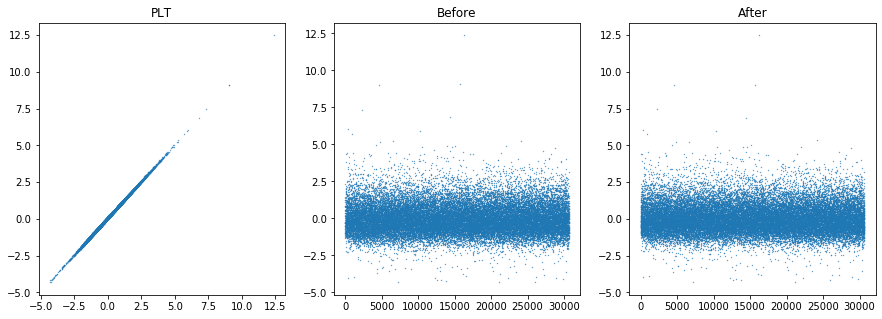

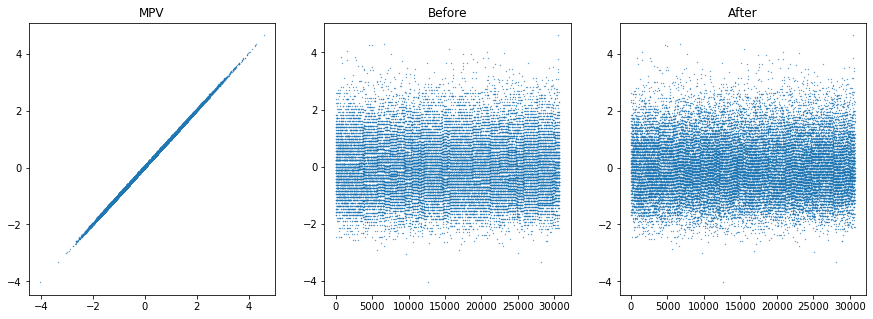

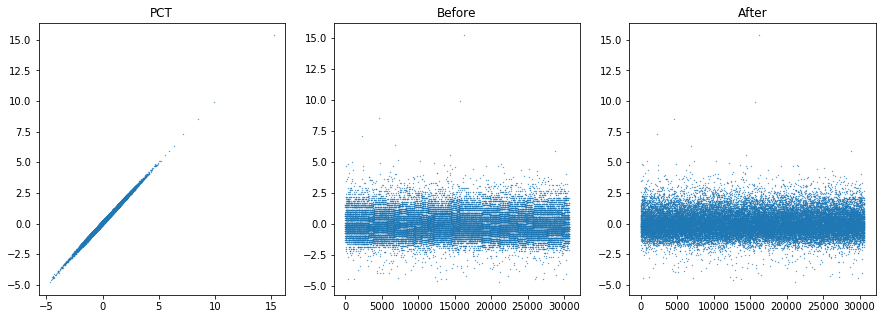

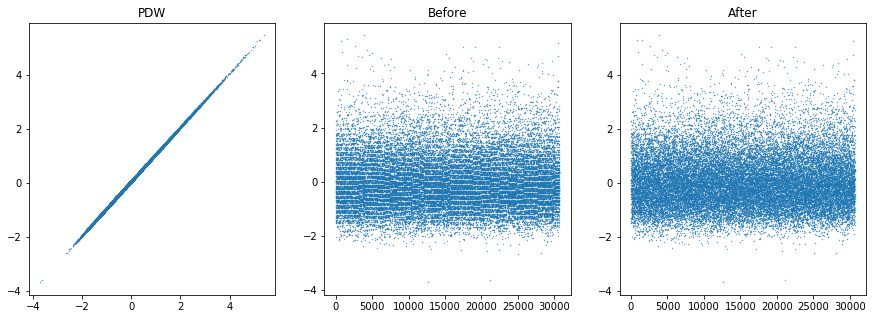

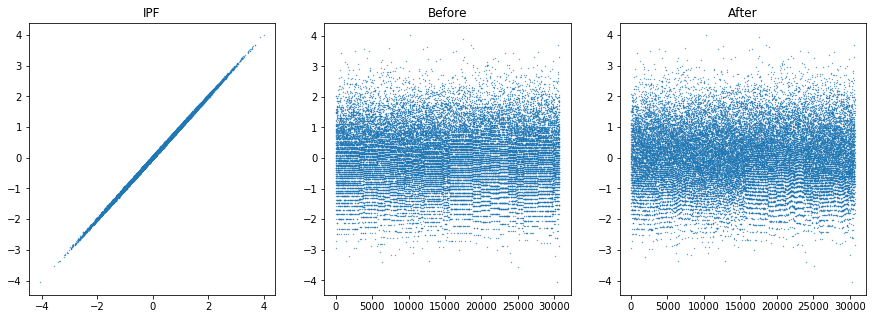

...

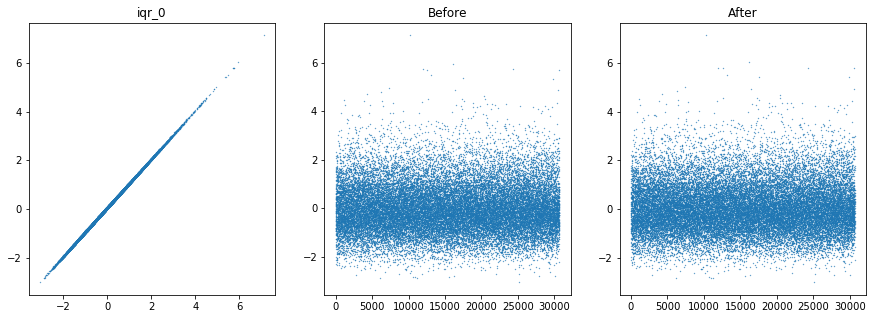

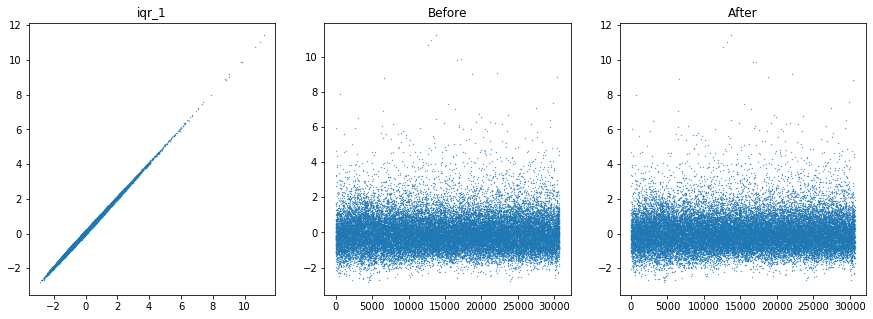

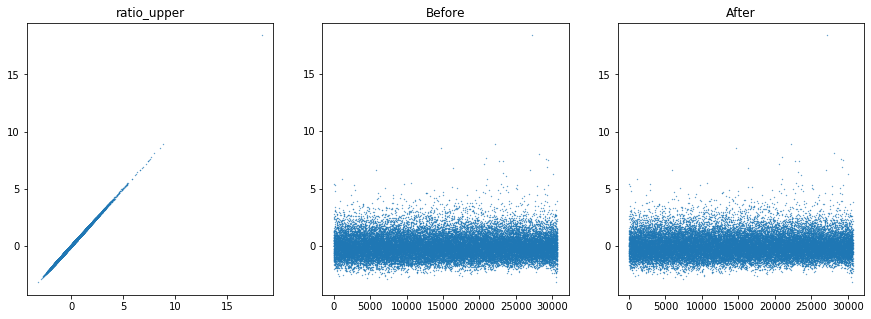

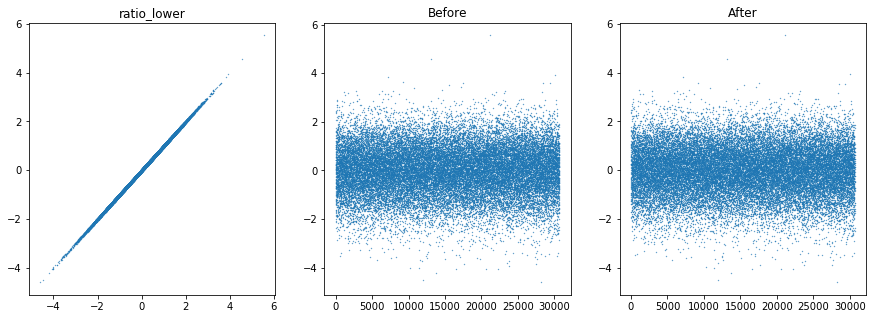

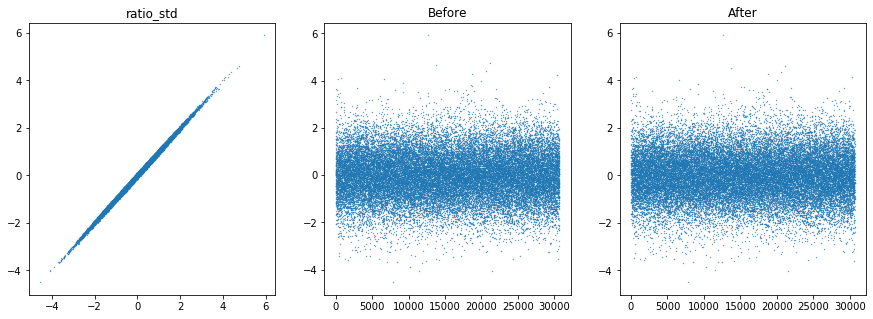

In [22]:
X = comp[["Instrument","cohort_training","hours","AGE","SEX_menopause","yearday"]].copy()

def index_of(column):
    for i, c in enumerate(X.columns):
        if c == column:
            return i

from pygam import LinearGAM, s, f, te
        
# Option : sans age/sex
#gam = LinearGAM(te(f(index_of("Instrument")),f(index_of("cohort"))) + \
#          te(s(index_of("hours")),f(index_of("Instrument"))) + \
#          s("yearday",basis="cp") + f(index_of("Instrument")))

# Option : avec age/sex (prennant en compte que les cohortes ne sont pas uniformes)

gams = {}

for col in to_adjust_technically:

    gam = LinearGAM(te(f(index_of("Instrument")),f(index_of("cohort_training"))) + \
          te(s(index_of("hours"),n_splines=5),f(index_of("Instrument"))) + \
                te(s(index_of("AGE"),n_splines=10),f(index_of("SEX_menopause"))) + \
          s(index_of("yearday"),basis="cp") + f(index_of("Instrument")))
    
    Y = comp[col]
    print(col)
    # CENTRAL is new. Does it work ?
    central = (Y > np.quantile(Y,0.1)) & (Y < np.quantile(Y,0.9))
    gam.gridsearch(X.loc[central].values,Y.loc[central])
    
    gams[col] = gam
    
    #print(gam.statistics_["p_values"])
    print(gam.statistics_["pseudo_r2"])
    
    Y_pred = gam.predict(X)
    
    fig = plt.figure(figsize=(15,5))
    ax = fig.add_subplot(1,3,1)
    plt.scatter(Y,Y-Y_pred,s=.1)
    plt.title(col)
    
    ax = fig.add_subplot(1,3,2)
    plt.scatter(comp["rank"],Y,s=.1)
    plt.title("Before")
    
    ax = fig.add_subplot(1,3,3)
    plt.scatter(comp["rank"],Y-Y_pred,s=.1)
    plt.title("After")
    
    comp["%s_raw" % col] = comp[col].copy() 
    comp["%s_tech" % col] = Y - Y_pred

In [24]:
for col in to_adjust_technically:
    comp["%s_tech" % col] = np.clip(comp["%s_tech" % col],
                                    a_min = comp["%s_tech" % col].median() - 3*comp["%s_tech" % col].std(),
                                    a_max = comp["%s_tech" % col].median() + 3*comp["%s_tech" % col].std())

In [25]:
def get_r2(df):
    dic = {}
    for c in to_adjust_technically:
        r, p = pearsonr(df["%s_tech" % c],df["%s_raw" % c])
        dic[c] = 1.-r**2
    return pd.Series(dic)
        
comp.groupby("cohort_training").apply(get_r2).mean(axis=1)

cohort_training
-1     0.018376
 3     0.019332
 4     0.008628
 5     0.012908
 6     0.012150
 7     0.012258
 8     0.007136
 9     0.002047
 10    0.005249
 11    0.002393
 12    0.014093
 13    0.009967
 14    0.015317
 15    0.011883
 16    0.006547
 17    0.005701
 18    0.008348
 19    0.016511
 20    0.011778
 21    0.009184
 22    0.008713
 23    0.003417
 24    0.010595
 25    0.005034
 26    0.005170
 27    0.008415
 28    0.006889
 29    0.015669
 30    0.013013
 31    0.007931
 32    0.014136
dtype: float64

In [26]:
# TODO : s'assurer que les colonnes sont bien nommées et reprises
# TODO : regarder le pourcentage de la variabilité intra-cohorte expliquée par la régression

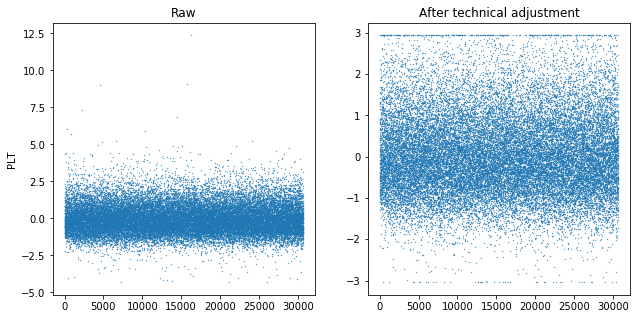

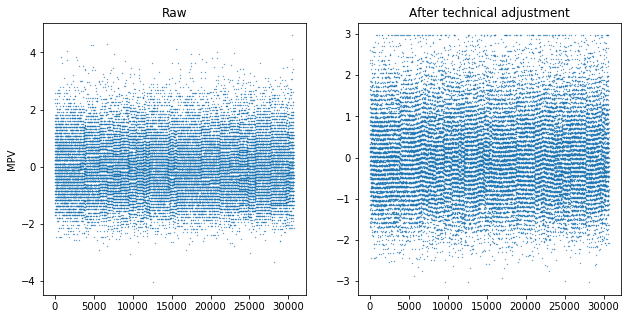

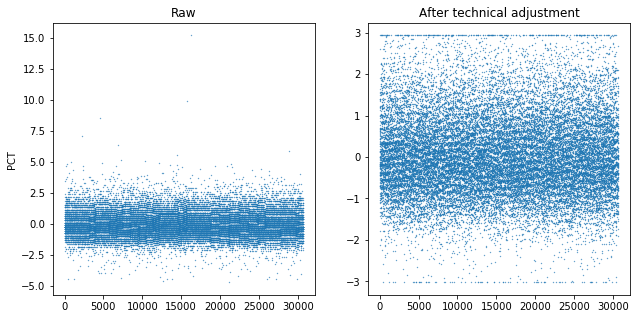

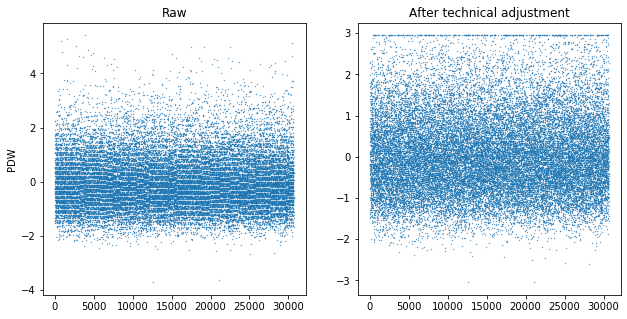

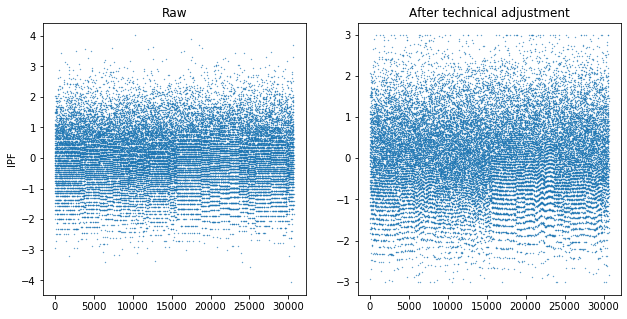

...

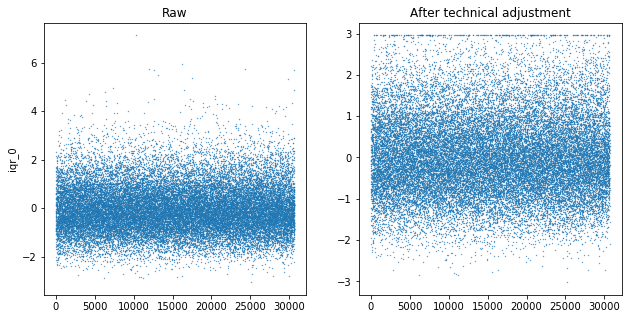

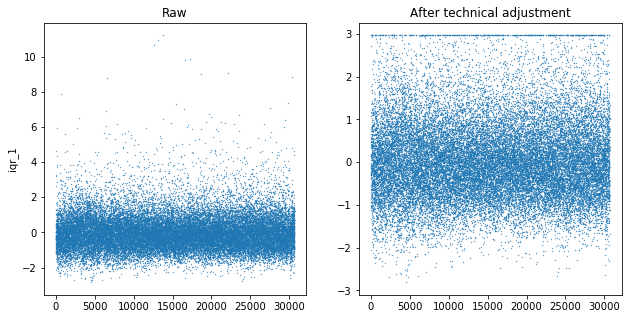

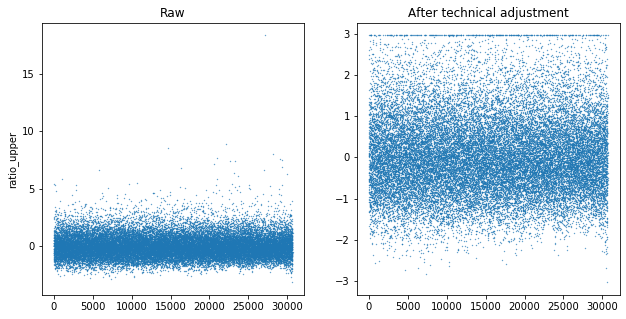

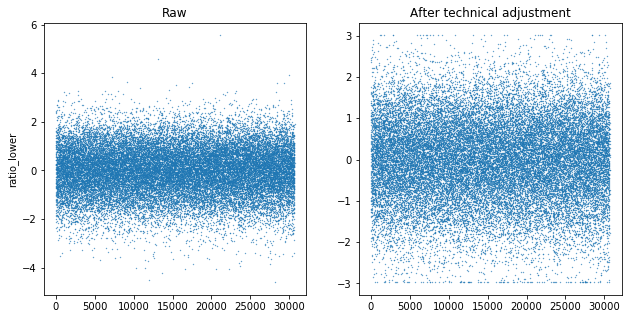

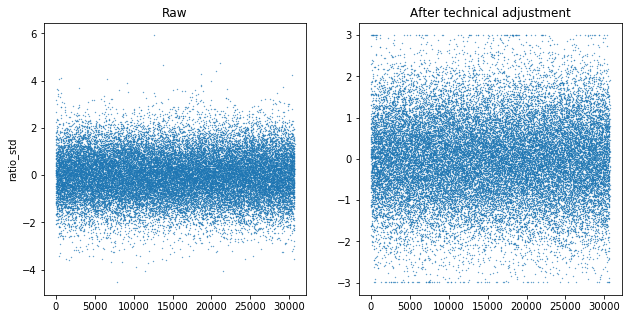

In [27]:
for col in to_adjust_technically:
    fig = plt.figure(figsize=(16,5))
    ax = fig.add_subplot(131)
    ax.set_title("Raw")
    ax.scatter(comp["rank"], comp["%s_raw"%col],s=.1)
    ax.set_ylabel(col)
    ax = fig.add_subplot(132)
    ax.set_title("After technical adjustment")
    plt.scatter(comp["rank"], comp["%s_tech" % col],s=.1)

# Adjust features by phenotypes

In [28]:
for c in to_adjust_technically:
    X_all.loc[comp.index,c] = comp["%s_tech" % c]

In [29]:
cholesky_adj = False
adj_by_cohorts = False
adjust_at_all = True

covar_cols = ["SEX","AGE","PLT","MPV","PDW","IPF","PCT"]

def correlate(X, cols1,cols2):
    C = (1./X.shape[0])*((X[cols1] - X[cols1].mean(axis=0))/X[cols1].std(axis=0)).T @ ((X[cols2] - X[cols2].mean(axis=0))/X[cols2].std(axis=0))
    return C

X_train = pd.merge(X_all,phenotypes,left_index=True,right_index=True,how="inner")
X_train_adj = X_train.copy()
X_int = X_all.loc[X_all.index.str.contains("INT_116")]
X_int_adj = X_int.copy()

In [30]:
for c in features_cols:
    r, p = pearsonr(X_train_adj.loc[~X_train_adj.ADP.isnull(),c],
             X_train_adj.loc[~X_train_adj.ADP.isnull(),"ADP"])
    print("%s   \t\t %.2f \t %.2e" % (c, r**2, p))

mean_0   		 0.04 	 1.62e-06
mean_1   		 0.05 	 2.33e-07
median_0   		 0.04 	 2.18e-06
median_1   		 0.05 	 2.82e-07
upper_0   		 0.04 	 9.13e-06
upper_1   		 0.02 	 7.48e-04
lower_0   		 0.05 	 8.01e-07
lower_1   		 0.08 	 1.84e-11
std_0   		 0.02 	 6.39e-04
std_1   		 0.05 	 2.27e-07
iqr_0   		 0.02 	 3.11e-03
iqr_1   		 0.07 	 2.12e-09
ratio_upper   		 0.05 	 7.46e-07
ratio_lower   		 0.00 	 4.66e-01
ratio_std   		 0.01 	 7.69e-02


In [31]:
if adjust_at_all:

    adj_X_train = []

    for train_cohort, sub_X_train in X_train.groupby("cohort"):
        lm_cohort = PLSRegression(n_components=4).fit(sub_X_train[covar_cols],sub_X_train[features_cols])
        sub_X_train[features_cols] -= lm_cohort.predict(sub_X_train[covar_cols])
        sub_X_train[features_cols] /= sub_X_train[features_cols].std()
        adj_X_train.append(sub_X_train)
    adj_X_train = pd.concat(adj_X_train,axis=0)
    X_train_adj = adj_X_train.copy()

    Q_train_adj = correlate(X_train_adj, features_cols,features_cols)

    def adjust_cholesky(Q_ref,X,plot=False):
        Q = correlate(X, features_cols,features_cols)
        L = cholesky(Q)
        L_ref = cholesky(Q_ref)
        X_decorr = X.copy()
        X_decorr[features_cols] = X[features_cols] @ np.linalg.inv(L)

        X_recorr = X_decorr.copy()
        X_recorr[features_cols] = X_recorr[features_cols] @ L_ref
        if plot:
            plt.figure()
            for f in features_cols:
                plt.scatter(X[f],X_recorr[f],label=f)
            plt.legend()
        return X_recorr

    if not adj_by_cohorts:
        X_int["cohort"] = 0
    X_int_adj = []

    for train_cohort, sub_X_int in X_int.groupby("cohort"):
        lm_cohort = PLSRegression(n_components=4).fit(sub_X_int[covar_cols],sub_X_int[features_cols])
        sub_X_int[features_cols] -= lm_cohort.predict(sub_X_int[covar_cols])

        if cholesky_adj:
            sub_X_int = adjust_cholesky(Q_train_adj,sub_X_int)
        #sub_X_int[features_cols] = np.clip(sub_X_int[features_cols],
        #                                   np.quantile(sub_X_int[features_cols],0.05,axis=0)-5,
        #                                   np.quantile(sub_X_int[features_cols],0.95,axis=0)+5)
        sub_X_int[features_cols] -= sub_X_int[features_cols].mean()
        sub_X_int[features_cols] /= sub_X_int[features_cols].std()

        X_int_adj.append(sub_X_int)

    X_int_adj = pd.concat(X_int_adj,axis=0)

In [32]:
X_train_adj.columns

Index(['SEX', 'AGE', 'PLT', 'MPV', 'PDW', 'PCT', 'IPF', 'cohort', 'mean_0',
       'mean_1', 'median_0', 'median_1', 'upper_0', 'upper_1', 'lower_0',
       'lower_1', 'std_0', 'std_1', 'iqr_0', 'iqr_1', 'ratio_upper',
       'ratio_lower', 'ratio_std', 'ADP_PSEL', 'ADP_FIB', 'ADP', 'CRP_PSEL',
       'CRP_FIB', 'CRP', 'TRAP_PSEL', 'TRAP_FIB', 'TRAP', 'PAR1_PSEL',
       'PAR1_FIB', 'PAR1', 'PAR4_PSEL', 'PAR4_FIB', 'PAR4'],
      dtype='object')

In [33]:
cond = ~X_train_adj.ADP.isnull()
for c in features_cols:
    rho, p = pearsonr(X_train_adj.loc[cond,c],X_train_adj.loc[cond,"ADP"])
    print("%s %.2f %.2e" % (c, rho**2,p))

mean_0 0.01 8.16e-03
mean_1 0.02 3.36e-04
median_0 0.01 2.42e-02
median_1 0.02 4.78e-04
upper_0 0.05 3.63e-07
upper_1 0.02 3.52e-03
lower_0 0.00 3.42e-01
lower_1 0.03 1.85e-05
std_0 0.03 3.86e-05
std_1 0.00 1.63e-01
iqr_0 0.04 5.11e-06
iqr_1 0.01 1.14e-02
ratio_upper 0.00 1.66e-01
ratio_lower 0.05 4.90e-07
ratio_std 0.03 4.27e-05


In [34]:
for f in features_cols:
    X_train_adj[f] = np.clip(X_train_adj[f],
                             X_train_adj[f].median() - 3*X_train_adj[f].std(),
                             X_train_adj[f].median() + 3*X_train_adj[f].std())

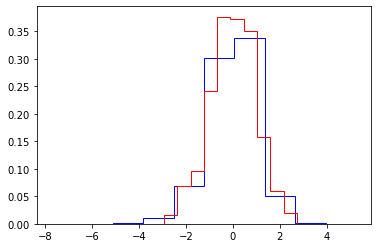

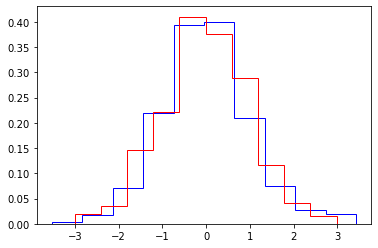

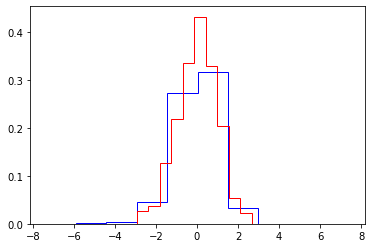

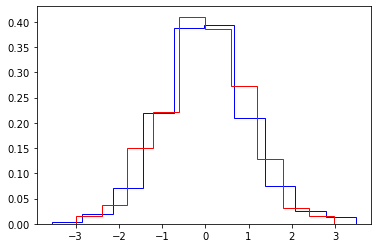

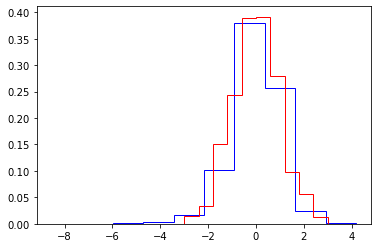

...

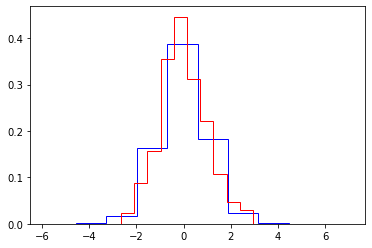

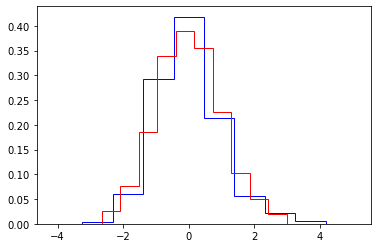

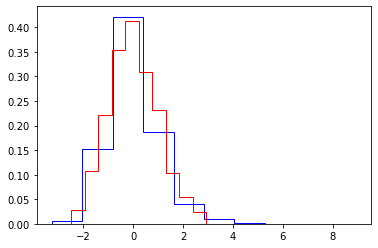

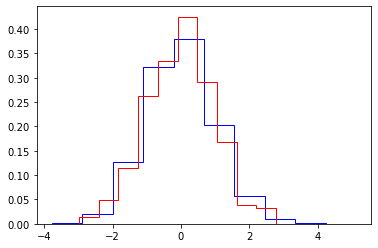

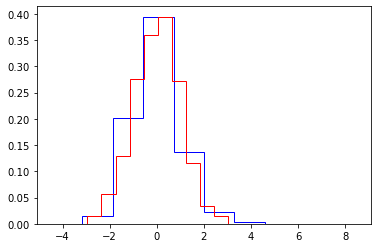

In [35]:
for f in features_cols:
    plt.figure()
    plt.hist(X_int_adj[f],color="blue",histtype="step",density=True)
    plt.hist(X_train_adj[f],color="red",histtype="step",density=True)

In [36]:
#int_phen, meta = get_INTERVAL_phenotypes()

In [37]:
int_values = X_int_adj[features_cols]

In [38]:
#X_int_adj.groupby("cohort")[features_cols].mean()

15 BKPS
16 BKPS


<Figure size 1008x504 with 0 Axes>

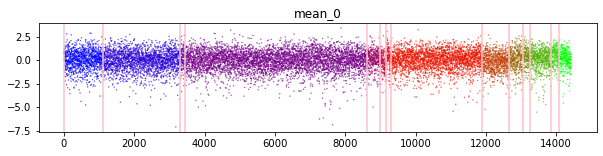

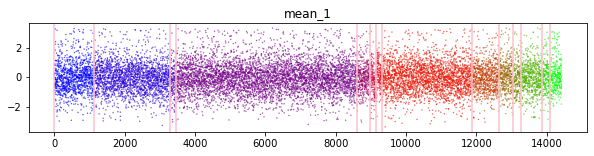

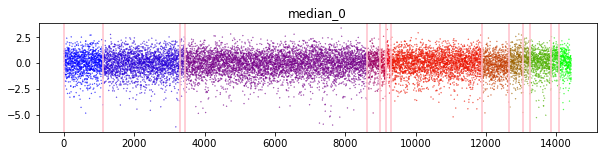

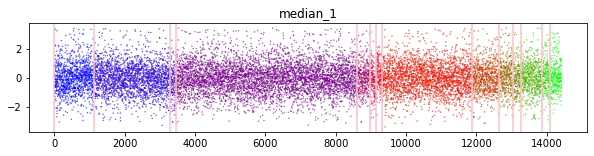

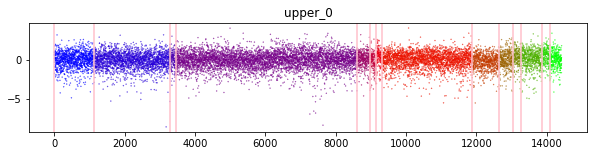

...

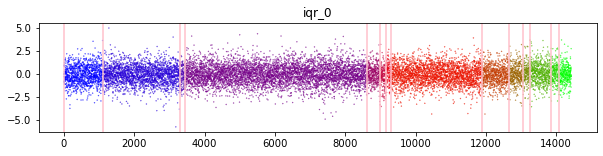

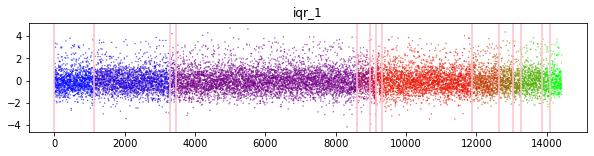

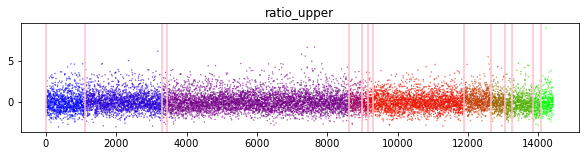

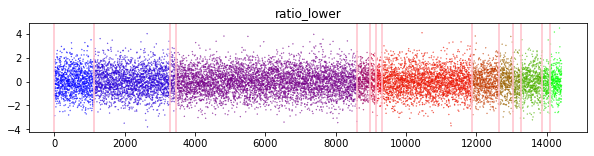

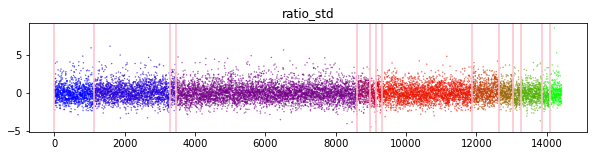

<Figure size 1008x504 with 0 Axes>

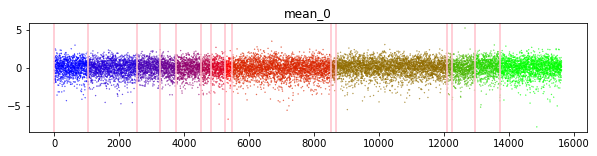

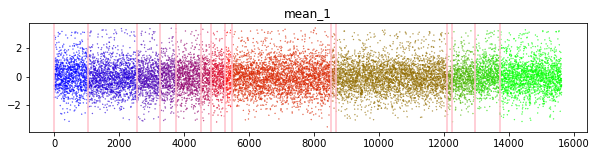

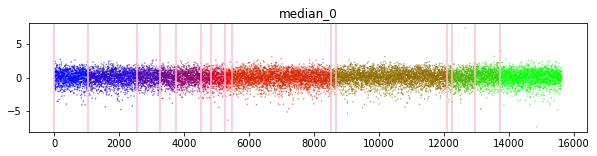

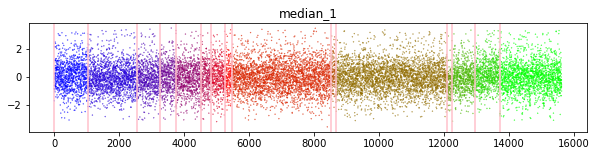

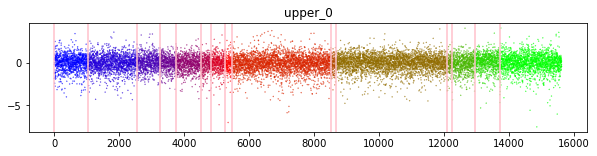

...

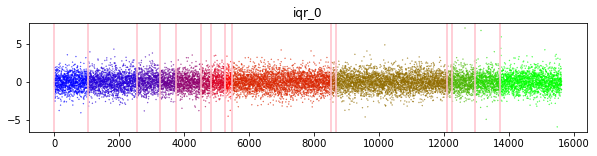

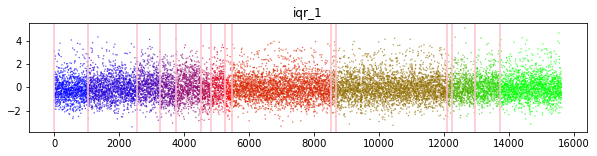

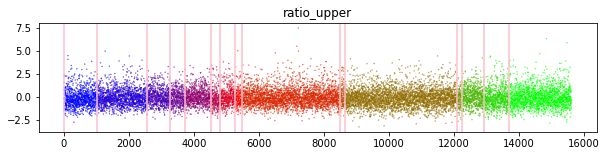

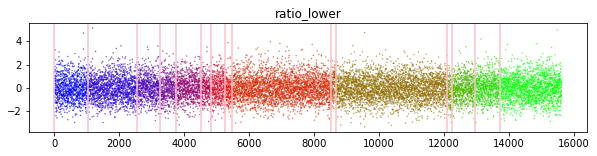

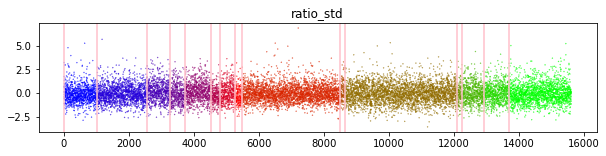

In [39]:
cohort_offset = 0
machines = int_phen["Instrument"].unique().tolist()
int_infos = []
for instrument in machines:
    int_info = pd.merge(int_values, int_phen.loc[int_phen.Instrument == instrument,
                                                      ["SampleNo","DateTime"]],
                        left_index=True,right_on="SampleNo",how="inner")
    int_info["DateTime"] = pd.to_datetime(int_info["DateTime"])
    int_info.sort_values("DateTime",inplace=True)
    X = int_info[features_cols].values
    
    algo_c = rp.KernelCPD(kernel="rbf", min_size=150).fit(
        X
    )
    
    bkps = algo_c.predict(pen=2.3)
    bkps = [0] + bkps
    print("%d BKPS" % len(bkps))

    int_info["cohort"] = cohort_offset
    int_info["rank"] = np.arange(int_info.shape[0])
    for b in bkps[1:]:
        int_info.loc[int_info["rank"] >= b,"cohort"] += 1

    plt.figure(figsize=(14,7))
    for i in range(X.shape[1]):
        plt.figure(figsize=(10,2))
        plt.title(features_cols[i])
        plt.scatter(int_info["rank"],X[:,i],s=.1,c=int_info.cohort,cmap="brg")
        for b in bkps[:-1]:
            plt.axvline(int_info["rank"].iloc[b],c="pink")
    int_infos.append(int_info)
    cohort_offset = int_info.cohort.max() + 1
int_info = pd.concat(int_infos,axis=0)

if not adj_by_cohorts:
    int_info["cohort"] = 1

In [40]:
#for c in int_info.cohort.unique():
#    cond = int_info.cohort == c
#    int_info.loc[cond,features_cols] -= int_info.loc[cond,features_cols].mean()
# Added
# int_info.loc[cond,features_cols] /= int_info.loc[cond,features_cols].std()

In [41]:
#int_info

In [42]:
#for cohort, sub_int_info in int_info.groupby("cohort"):
#    if sub_int_info.shape[0] < 500: continue
#    plt.figure()
#    plt.title(cohort)
#    for c in features_cols:
#        deltas = [1,2,3,4,5,100]
#        plt.plot(np.arange(len(deltas)),[np.mean(sub_int_info[c].iloc[d:].values*sub_int_info[c].iloc[:-d].values) for d in deltas],label=c)
#    plt.legend()

In [43]:
#int_info.set_index("SampleNo",inplace=True)

In [44]:
#for f in features_cols:
#    if f in X_int_adj.columns:
#        del X_int_adj[f]
#X_int_adj = pd.merge(X_int_adj,int_info[features_cols],left_index=True,right_index=True)

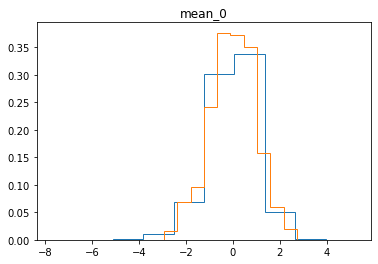

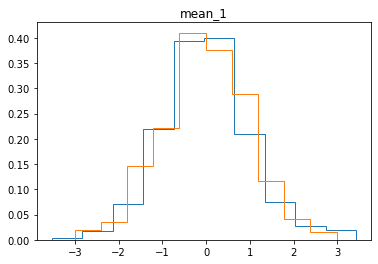

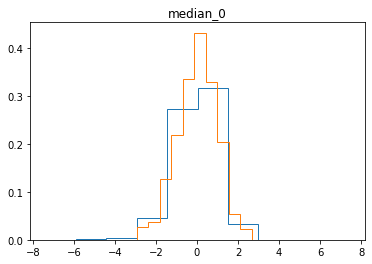

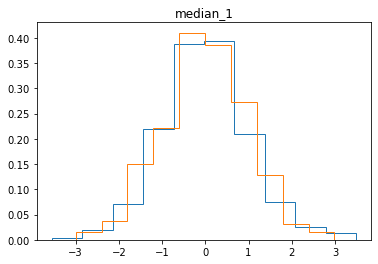

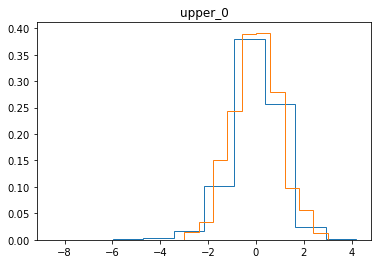

...

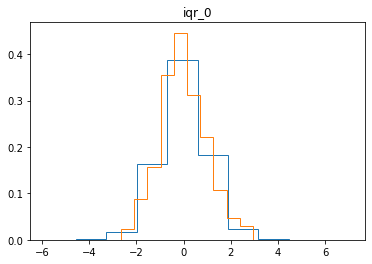

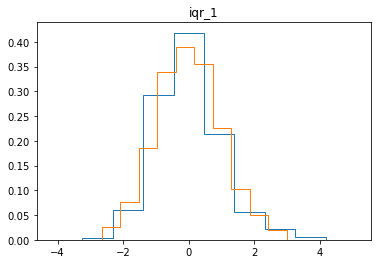

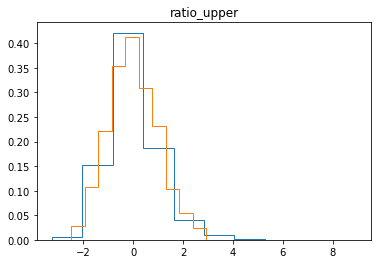

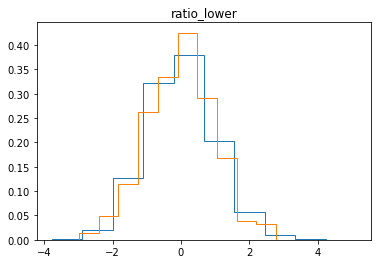

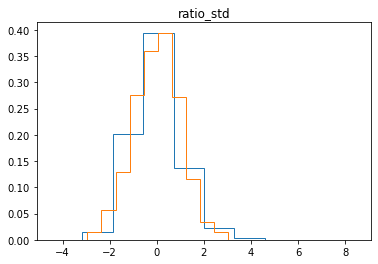

In [45]:
for c in features_cols:
    plt.figure()
    plt.title(c)
    plt.hist(X_int_adj[c],density=True,histtype="step")
    plt.hist(X_train_adj[c],density=True,histtype="step")

In [46]:
#X_int_adj  [features_cols] = np.clip(X_int_adj  [features_cols],-4,4)
#X_train_adj[features_cols] = np.clip(X_train_adj[features_cols],-4,4)

In [47]:
C_train = correlate(X_train, covar_cols,features_cols)
C_train_adj = correlate(X_train_adj, covar_cols,features_cols)
Q_train = correlate(X_train, features_cols,features_cols)
Q_train_adj = correlate(X_train_adj, features_cols,features_cols)

C_int = correlate(X_int, covar_cols,features_cols)
C_int_adj = correlate(X_int_adj, covar_cols,features_cols)
Q_int = correlate(X_int, features_cols,features_cols)
Q_int_adj = correlate(X_int_adj, features_cols,features_cols)

In [48]:
plot_args = {"vmin":-1,"vmax":1,"cmap":"bwr"}

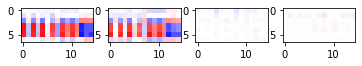

In [49]:
fig = plt.figure()
ax = fig.add_subplot(1,4,1)
ax.imshow(C_train,**plot_args)
ax = fig.add_subplot(1,4,2)
ax.imshow(C_int,**plot_args)
ax = fig.add_subplot(1,4,3)
ax.imshow(C_train_adj,**plot_args)
ax = fig.add_subplot(1,4,4)
ax.imshow(C_int_adj,**plot_args)

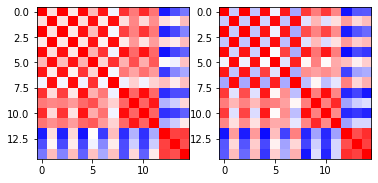

In [50]:
fig = plt.figure()
ax = fig.add_subplot(121)
ax.imshow(Q_int,**plot_args)
ax = fig.add_subplot(122)
ax.imshow(Q_train,**plot_args)

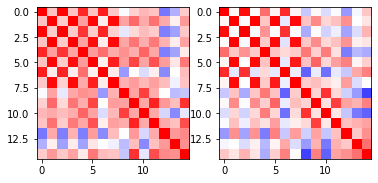

In [51]:
fig = plt.figure()
ax = fig.add_subplot(121)
ax.imshow(Q_int_adj,**plot_args)
ax = fig.add_subplot(122)
ax.imshow(Q_train_adj,**plot_args)

In [52]:
chol_adj = False

if chol_adj:

    L_int = cholesky(Q_int_adj)
    L_train = cholesky(Q_train_adj)
    X_int_decorr = X_int_adj.copy()
    X_int_decorr[features_cols] = X_int_adj[features_cols] @ np.linalg.inv(L_int)
    print(correlate(X_int_decorr,features_cols,features_cols))
    X_int_recorr = X_int_decorr.copy()
    X_int_recorr[features_cols] = X_int_recorr[features_cols] @ L_train
    print(correlate(X_int_recorr,features_cols,features_cols))
    print(Q_train_adj)
    for f in features_cols:
        plt.scatter(X_int_adj[f],X_int_recorr[f],label=f)
    plt.legend()
    X_int_adj = X_int_recorr

In [53]:
Q_int_adj = correlate(X_int_adj, features_cols,features_cols)

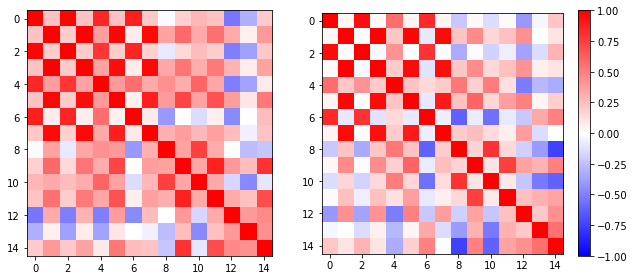

In [54]:
fig = plt.figure(figsize=(9.3,4))
ax = fig.add_subplot(121)
ax.imshow(Q_int_adj,**plot_args)
ax = fig.add_subplot(122)
cm  = ax.imshow(Q_train_adj,**plot_args)
plt.colorbar(cm)
plt.tight_layout()

In [55]:
pca_train = PCA().fit(X_train_adj[features_cols])
pca_int = PCA().fit(X_int_adj[features_cols])

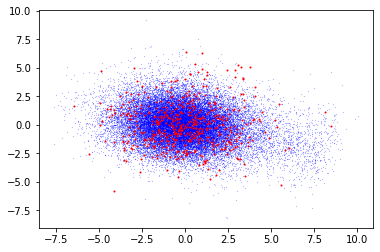

In [56]:
X_t_train = pca_train.transform(X_train_adj[features_cols])
X_t_int   = pca_train.transform(X_int_adj  [features_cols])

plt.scatter(X_t_int  [:,0],X_t_int  [:,1],s=.01,c="blue")
plt.scatter(X_t_train[:,0],X_t_train[:,1],s=1,c="red")

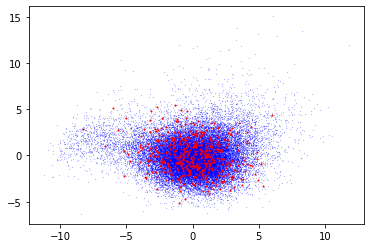

In [57]:
X_t_train = pca_int.transform(X_train_adj[features_cols])
X_t_int   = pca_int.transform(X_int_adj  [features_cols])

plt.scatter(X_t_int  [:,0],X_t_int  [:,1],s=.01,c="blue")
plt.scatter(X_t_train[:,0],X_t_train[:,1],s=1,c="red")

In [58]:
#re_scale = True
# -> Il vaut mieux mettre True
#if re_scale:
#    X_int_adj[features_cols] *= int_std
#    X_train_adj[features_cols] *= train_std

In [59]:
pd.concat([X_int_adj[features_cols].std(axis=0),X_train_adj[features_cols].std(axis=0)],axis=1)

,0,1
mean_0,1.0,0.996661
mean_1,1.0,0.985173
median_0,1.0,0.991568
median_1,1.0,0.985885
upper_0,1.0,0.992062
upper_1,1.0,0.982607
lower_0,1.0,0.988382
lower_1,1.0,0.991412
std_0,1.0,0.994511
std_1,1.0,0.978785


# Estimate performance

In [111]:
#features_cols = ["lower_0","median_0","mean_0"]
features_cols = features.columns

In [112]:
N_PLS_COMPS = 1

In [113]:
# TODO : bien mettre les covariates ajustés dans X_adj.

In [114]:
X_train_adj

,SEX,AGE,PLT,MPV,PDW,PCT,IPF,cohort,mean_0,mean_1,...,CRP,TRAP_PSEL,TRAP_FIB,TRAP,PAR1_PSEL,PAR1_FIB,PAR1,PAR4_PSEL,PAR4_FIB,PAR4
C0WX14,2,67.0,0.449343,-1.125201,-1.007105,-0.415152,-0.594791,0,0.996710,0.078327,...,1.685285,-0.490151,1.844545,0.677197,-0.098814,1.425226,0.663206,-0.685623,1.099728,0.207053
C0WX4Z,2,63.0,0.066289,-0.079510,0.018928,-0.234960,-0.516775,0,0.499475,-0.106836,...,0.362048,-0.395474,-0.784346,-0.589910,NaN,NaN,NaN,-0.166033,0.081331,-0.042351
C0WX6V,2,64.0,0.445803,-0.195591,-0.288766,0.150568,0.175383,0,0.201107,0.555339,...,-0.074469,-1.243378,-0.737206,-0.990292,-0.793386,-0.306747,-0.550067,-2.451255,-1.434140,-1.942698
C0WX7T,2,70.0,0.312938,0.966411,0.993291,0.548951,0.067739,0,-0.546318,1.891979,...,1.537886,0.510721,0.624109,0.567415,0.377554,0.863674,0.620614,-0.158951,0.416598,0.128823
C0WX8R,2,71.0,0.175201,0.733838,0.582821,0.357145,0.595812,0,-0.013039,-0.901917,...,0.386614,-0.495266,-0.750737,-0.623001,-0.433924,-0.759575,-0.596749,0.165842,0.036509,0.101175
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C1A2PI,1,69.0,-0.327233,0.159980,0.458387,-0.162893,-0.249895,2,0.285990,-0.050958,...,-1.194847,-1.189155,-1.185418,-1.187287,-1.869582,-1.499164,-1.684373,-1.231650,-0.330351,-0.781000
C1A2RE,1,60.0,-0.509467,0.625140,1.073990,-0.220633,0.001461,2,1.036936,-1.085862,...,1.323425,-1.557359,-0.363892,-0.960626,-1.163251,-0.341577,-0.752414,-0.416502,0.370576,-0.022963
C1A2TA,2,42.0,-0.399810,-0.436596,-0.475783,-0.801722,-1.111767,2,1.243178,-1.232344,...,-3.917361,-0.596221,0.356073,-0.120074,-0.042682,0.973401,0.465360,-1.283859,-0.172981,-0.728420
C1A2X2,1,71.0,-1.015469,-0.766845,-0.412693,-1.114500,-1.331110,2,-0.536779,-0.392983,...,0.056476,-1.586644,1.248148,-0.169248,-1.098709,0.618427,-0.240141,-0.812626,1.167567,0.177470


In [115]:
learn_adjuster = False
use_pls = True

In [116]:
rho_cov = defaultdict(lambda: [])
rho_all = defaultdict(lambda: [])
y_pred_test = {}
y_test = {}
r2_cov = defaultdict(lambda: [])
r2_all = defaultdict(lambda: [])
r2_res = defaultdict(lambda: [])
for c in pheno_cols:
    skf = RepeatedStratifiedKFold(n_splits=4,n_repeats=100)
    y = X_train_adj[c]
    cond = ~y.isnull()
    X = X_train_adj.loc[cond,features_cols]
    C = X_train_adj.loc[cond,covar_cols]
    y = y.loc[cond]
    
    y_split = pd.cut(y,5,labels=False)
    
    for i, (train_index, test_index) in enumerate(skf.split(np.zeros(len(y_split)), y_split)):
        #print(len(train_index),len(test_index))
        if learn_adjuster:
            pls = PLSRegression(n_components=1)
            pls.fit(C.iloc[train_index],y.iloc[train_index])
            y_cov = np.reshape(pls.predict(C),(-1,1))
        else:
            y_cov = np.zeros((y.shape[0],1))
        
        residuals = y-y_cov[:,0]
        if use_pls:
            pls_res = PLSRegression(n_components=N_PLS_COMPS)
        else:
            pls_res = LinearRegression()
        pls_res.fit(X.iloc[train_index],residuals.iloc[train_index])
        y_res = np.reshape(pls_res.predict(X),(-1,1))
        y_pred = y_cov + y_res
        
        pearson_all = pearsonr(y.iloc[test_index],y_pred[test_index,0])[0]
        pearson_cov = pearsonr(y.iloc[test_index],y_cov[test_index,0])[0]
        
        rho_cov[c].append(pearson_cov)
        rho_all[c].append(pearson_all)
        r2_all[c].append(r2_score(y.iloc[test_index],y_pred[test_index,0]))
        r2_cov[c].append(r2_score(y.iloc[test_index],y_cov[test_index,0]))
        r2_res[c].append(r2_score(residuals.iloc[test_index],y_res[test_index,0]))
        
        if i == 0:
            
            y_pred_test[c] = y_pred[test_index,0]
            y_test[c] = y.iloc[test_index]
        

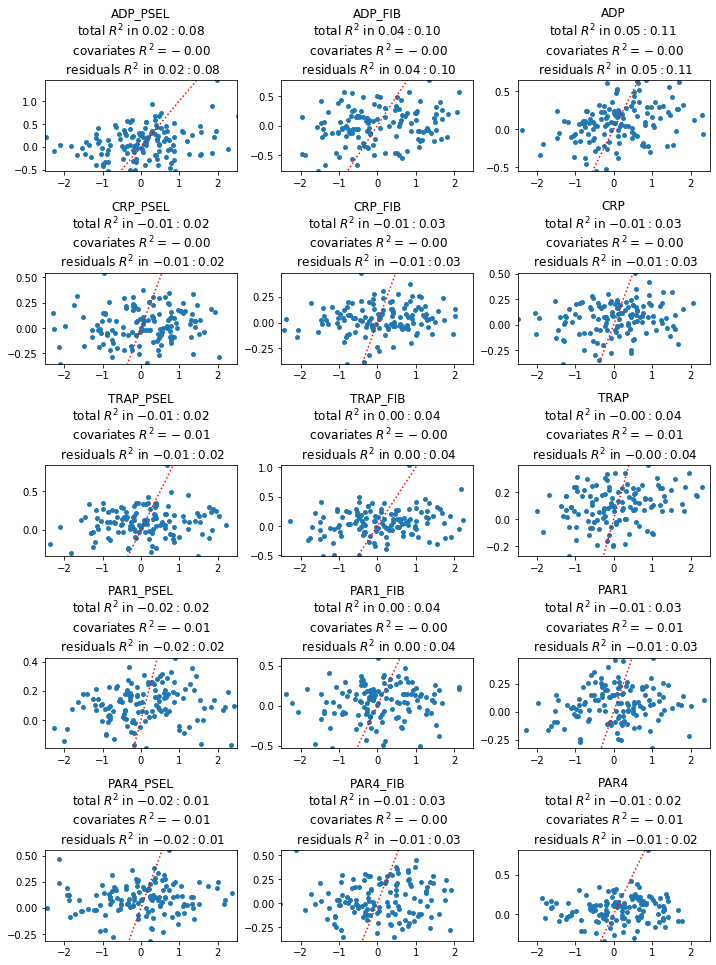

In [117]:
from sklearn.metrics import r2_score
fig = plt.figure(figsize=(10,40))
for i, c in enumerate(pheno_cols):
    ax = fig.add_subplot(len(pheno_cols),3,i+1)
    ax.scatter(y_test[c],y_pred_test[c],s=15)
    
    ax.set_xlim((-2.5,2.5))
    ax.plot([-1.5,1.5],[-1.5,1.5],c="red",ls=":")
    ax.set_ylim((np.min(y_pred_test[c]),np.max(y_pred_test[c])))
    #R2 = r2_score(y_test[c],y_pred_test[c])
    R2 = (np.quantile(r2_all[c],0.25),np.quantile(r2_all[c],0.75))
    
    R2_res = (np.quantile(r2_res[c],0.25),np.quantile(r2_res[c],0.75))
    R2_cov = np.median(r2_cov[c])
    ax.set_title("%s\ntotal $R^2$ in $%.2f:%.2f$ \n covariates $R^2 = %.2f $ \n residuals $R^2$ in $%.2f:%.2f $" % (c,R2[0],R2[1],R2_cov,R2_res[0],R2_res[1]))
plt.tight_layout()
#plt.savefig("%s/predictions_test.pdf" % export_folder)

# Fit on whole dataset

In [118]:
pls = {}
pls_res = {}

predictions = pd.DataFrame(index=X_train_adj.index)

for c in pheno_cols:
    y = X_train_adj[c]
    cond = ~y.isnull()
    X = X_train_adj.loc[cond,features_cols]
    C = X_train_adj.loc[cond,covar_cols]
    y = y.loc[cond]
    if learn_adjuster:
        pls[c] = PLSRegression(n_components=1)
        pls[c].fit(C,y)
        y_cov = np.reshape(pls[c].predict(C),(-1,1))
    else:
        y_cov = np.zeros((y.shape[0],1))

    residuals = y-y_cov[:,0]
    if use_pls:
        pls_res[c] = PLSRegression(n_components=N_PLS_COMPS)
    else:
        pls_res[c] = LinearRegression()
    pls_res[c].fit(X,residuals)
    y_pred = y_cov + np.reshape(pls_res[c].predict(X),(-1,1))
    
    predictions[c] = np.nan
    predictions.loc[cond,c] = y_pred[:,0]
    predictions.loc[cond,c] = np.clip(predictions.loc[cond,c],
                                      a_min = predictions.loc[cond,c].mean()-2*predictions.loc[cond,c].std(),
                                      a_max = predictions.loc[cond,c].mean()+2*predictions.loc[cond,c].std())

In [119]:
for c in pheno_cols:
    c_cond = ~predictions[c].isnull()
    r, p = pearsonr(predictions.loc[c_cond,c],X_train_adj.loc[c_cond,c])
    print("%s : R^2 = %.2f" % (c, r**2))

ADP_PSEL : R^2 = 0.07
ADP_FIB : R^2 = 0.08
ADP : R^2 = 0.09
CRP_PSEL : R^2 = 0.02
CRP_FIB : R^2 = 0.03
CRP : R^2 = 0.03
TRAP_PSEL : R^2 = 0.02
TRAP_FIB : R^2 = 0.04
TRAP : R^2 = 0.03
PAR1_PSEL : R^2 = 0.02
PAR1_FIB : R^2 = 0.04
PAR1 : R^2 = 0.03
PAR4_PSEL : R^2 = 0.02
PAR4_FIB : R^2 = 0.03
PAR4 : R^2 = 0.02


# Predict on Interval

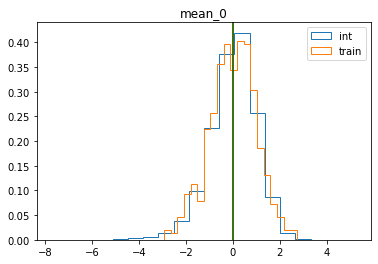

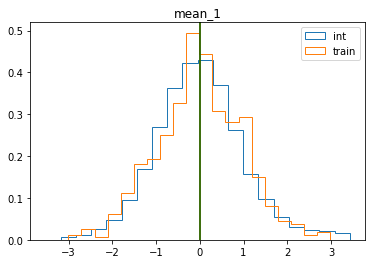

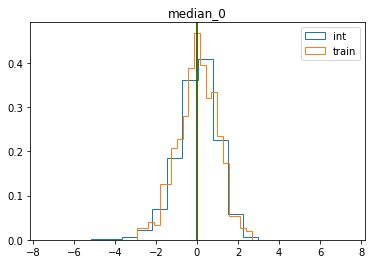

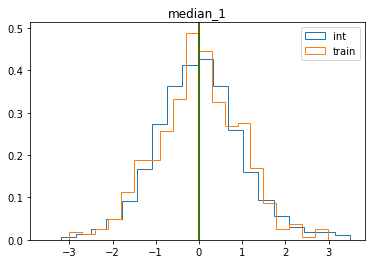

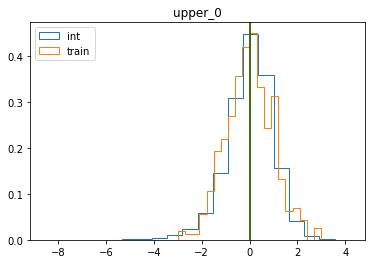

...

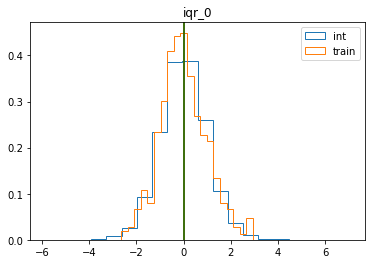

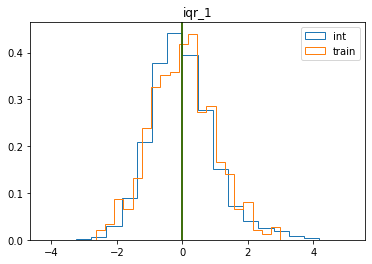

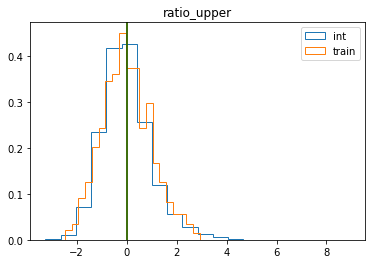

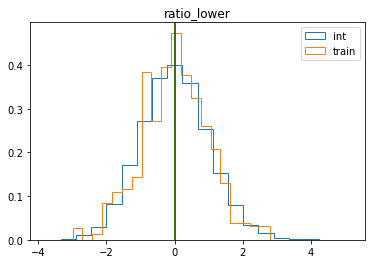

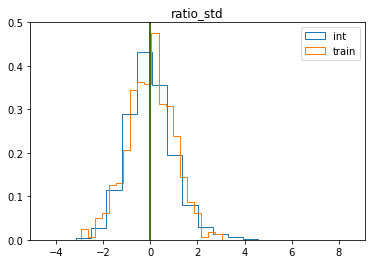

In [120]:
for f in features_cols:
    plt.figure()
    plt.hist(X_int_adj[f],density=True,histtype="step",bins=20,label="int")
    plt.axvline(np.mean(X_int_adj[f]),c="red")
    plt.hist(X_train_adj[f],density=True,histtype="step",bins=20,label="train")
    plt.axvline(np.mean(X_train_adj[f]),c="green")
    plt.title(f)
    plt.legend()

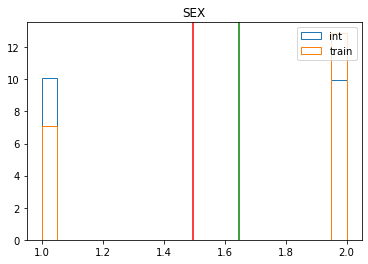

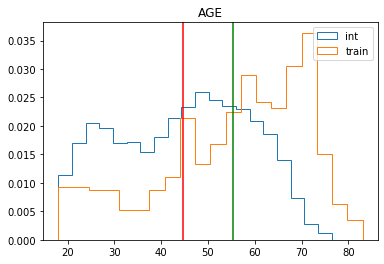

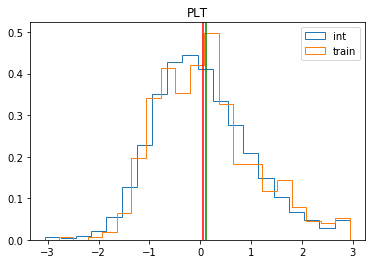

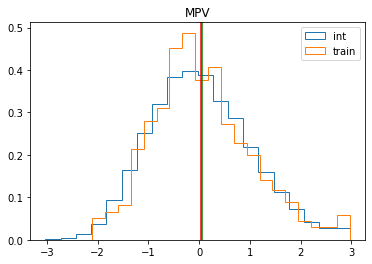

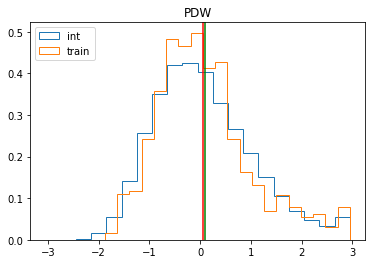

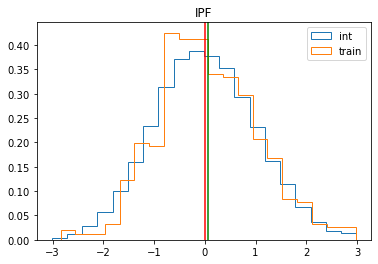

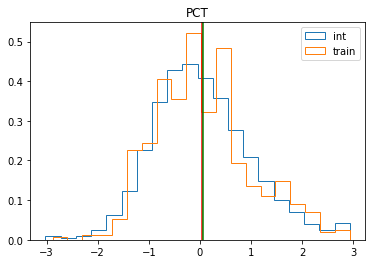

In [121]:
for f in covar_cols:
    plt.figure()
    plt.hist(X_int_adj[f],density=True,histtype="step",bins=20,label="int")
    plt.axvline(np.mean(X_int[f]),c="red")
    plt.hist(X_train_adj[f],density=True,histtype="step",bins=20,label="train")
    plt.axvline(np.mean(X_train[f]),c="green")
    plt.title(f)
    plt.legend()

In [122]:
predictions = pd.DataFrame(index=X_int_adj.index)

for c in pheno_cols:
    X = X_int_adj[features_cols]
    C = X_int_adj[covar_cols]
    
    if learn_adjuster:
        y_cov = np.reshape(pls[c].predict(C),(-1,1))
    y_pred = np.reshape(pls_res[c].predict(X),(-1,1)) #+ y_cov 
    
    predictions[c] = y_pred[:,0]

In [123]:
predictions

,ADP_PSEL,ADP_FIB,ADP,CRP_PSEL,CRP_FIB,CRP,TRAP_PSEL,TRAP_FIB,TRAP,PAR1_PSEL,PAR1_FIB,PAR1,PAR4_PSEL,PAR4_FIB,PAR4
INT_116_6580100,-0.071680,-0.131662,-0.102681,-0.062300,-0.084703,-0.071838,0.016464,-0.073633,-0.030074,-0.044026,-0.107442,-0.072204,0.020811,-0.008574,0.014452
INT_116_6580000,-0.081229,-0.115122,-0.094154,0.004122,-0.034854,-0.002051,0.035772,-0.034322,-0.001971,0.035372,-0.031503,0.005102,0.057347,-0.013413,0.021953
INT_116_4555900,0.387860,0.418766,0.417376,0.208837,0.229955,0.224256,0.266096,0.291626,0.275398,0.194535,0.262261,0.226514,0.219456,0.274602,0.249214
INT_116_4555800,0.074812,0.071150,0.080166,0.106271,0.070908,0.100289,0.105972,0.077574,0.088582,0.109744,0.088036,0.101040,0.115014,0.068091,0.090665
INT_116_4556000,0.058898,0.079542,0.080358,0.145193,0.097917,0.137090,0.141245,0.113645,0.127025,0.191760,0.145872,0.171658,0.120679,0.040087,0.075682
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INT_116_7187400,0.275021,0.289084,0.292844,0.143145,0.147397,0.148324,0.205466,0.199700,0.200246,0.136761,0.167715,0.152076,0.154965,0.189042,0.177598
INT_116_3437600,-0.031768,-0.075831,-0.052385,0.062001,-0.018596,0.029269,0.061720,-0.037228,0.012423,0.042707,-0.026505,0.011595,0.072873,-0.006180,0.036286
INT_116_3437700,0.220272,0.220388,0.230624,0.249916,0.162613,0.219408,0.210016,0.153874,0.180702,0.199006,0.193878,0.198209,0.215214,0.147345,0.178430
INT_116_1077600,0.202642,0.203381,0.212328,0.133906,0.111933,0.130385,0.169310,0.144980,0.154704,0.122504,0.133144,0.128127,0.153356,0.149504,0.154429


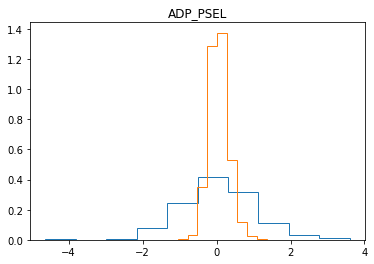

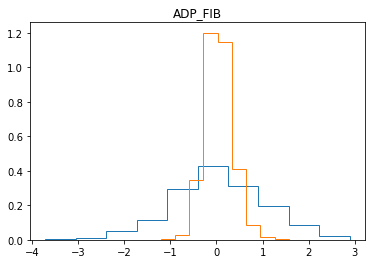

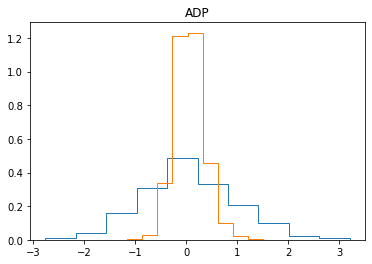

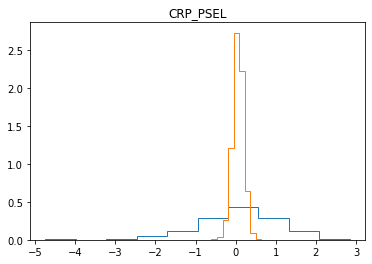

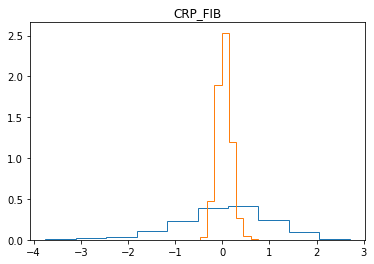

...

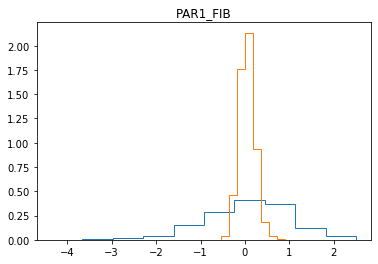

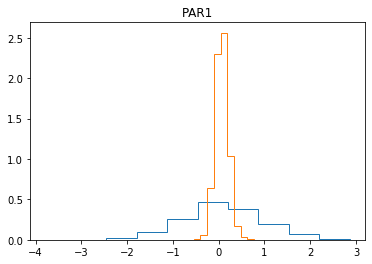

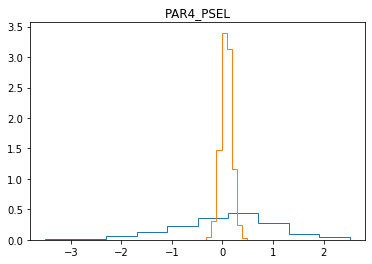

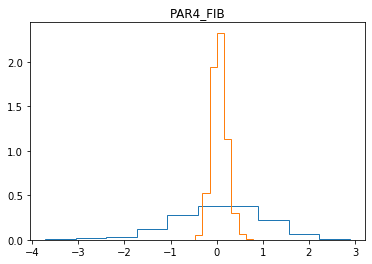

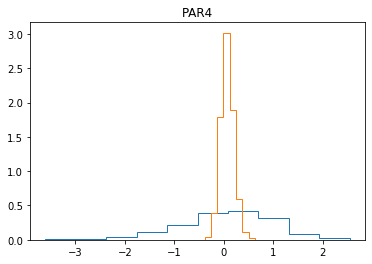

In [124]:
for c in pheno_cols:
    plt.figure()
    plt.hist(phenotypes[c],histtype="step",density=True)
    plt.hist(predictions[c],histtype="step",density=True)
    plt.title(c)

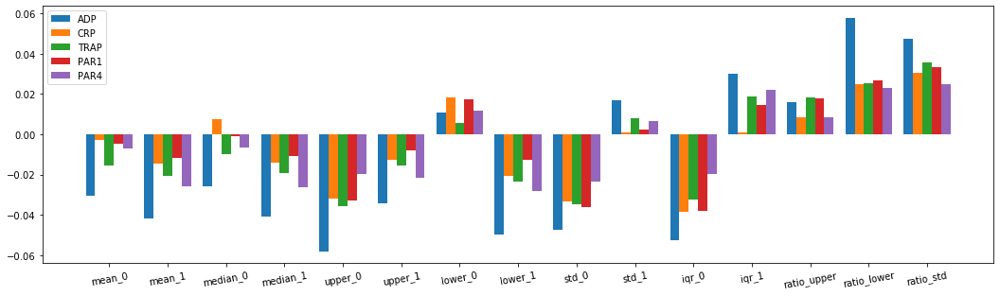

In [125]:
plt.figure(figsize=(18,5))
w = 0.16
for i,c in enumerate([c for c in pheno_cols if "_" not in c]):
    plt.bar(x=np.arange(len(features_cols))+w*(i-2),height=np.reshape(pls_res[c].coef_,(-1)),width=w,label=c)
plt.xticks(np.arange(len(features_cols)),features_cols,rotation=10)
plt.legend();

In [110]:
predictions.to_csv("%s/processed/predictions.csv" % data_dir)
features.to_csv("%s/processed/features.csv" % data_dir)

In [233]:
X_all[sysmex_covariates].to_csv("%s/processed/sysmex_features_adjusted.csv"  % data_dir)

In [234]:
comp.tail()

,SEX,AGE,PLT,MPV,PDW,PCT,IPF,cohort,mean_0,mean_1,...,iqr_0_raw,iqr_0_tech,iqr_1_raw,iqr_1_tech,ratio_upper_raw,ratio_upper_tech,ratio_lower_raw,ratio_lower_tech,ratio_std_raw,ratio_std_tech
SampleNo,,,,,,,,,,,,,,,,,,,,,
C1A2PI,1,69.0,-0.481191,0.061732,0.313194,-0.386105,-0.313327,2,-0.096080,-0.293129,...,0.221133,0.305415,0.309464,0.329118,-0.118237,-0.215116,-0.650429,-0.816243,-0.707501,-0.584757
C1A2RE,1,60.0,-0.636262,0.526188,0.928230,-0.386105,-0.060237,2,0.582753,-1.262727,...,0.068472,0.134093,0.956572,0.986271,-0.524297,-0.598843,-0.165561,-0.292452,-0.167731,-0.048716
C1A2TA,2,42.0,-0.446730,-0.518839,-0.609359,-0.770083,-1.165559,2,-0.367651,-0.767239,...,-0.299178,-0.234182,-0.611745,-0.635963,0.106774,0.076047,0.163538,0.106067,0.263901,0.283925
C1A2X2,1,71.0,-1.170397,-0.867182,-0.558106,-1.346050,-1.398614,2,-1.317171,-0.272500,...,-0.871344,-0.784655,0.675121,0.776598,1.092798,0.994991,1.930372,1.767669,1.320147,1.468417
C1A32N,2,44.0,-0.567342,0.758417,0.620712,-0.002126,0.360393,2,0.443508,-0.769331,...,0.145105,0.208504,1.242073,1.297815,-0.505939,-0.545366,0.327769,0.277502,0.238045,0.319985


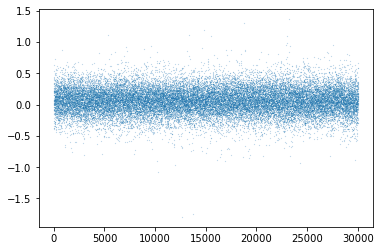

In [95]:
plt.scatter(comp.loc[predictions.index,"rank"],predictions["ADP"],s=.01)

# Export cohorts and predictions

In [236]:
int_phen, meta = get_INTERVAL_phenotypes()

Loading INTERVAL phenotypes
(48460, 760)
(45040, 760)
(38832, 760)
(112535, 11)
(102595, 11)


KeyboardInterrupt: 

In [483]:
comp = pd.merge(predictions,int_phen,left_index=True,right_on="SampleNo")
#comp = pd.merge(comp, int_info[["cohort"]],left_on="SampleNo",right_index=True)

In [485]:
#comp[["SampleNo","cohort"]].to_csv("%s/processed/bkpts_cohorts.csv" % data_dir,index=False)
comp.set_index("SampleNo")[predictions.columns].to_csv("%s/processed/predictions.csv" % data_dir)

In [ ]:
print(comp.shape)

# Fix breakpoints and Export

In [58]:
int_phen, meta = get_INTERVAL_phenotypes()

Loading INTERVAL phenotypes
(48460, 760)
(45040, 760)
(38832, 760)
(112535, 11)
(102595, 11)
(17768, 772)
(32574, 777)
(32727, 777)
Checked that each Sample has one row max
Removing samples with less than 10 measurements per day
(30725, 782)


In [60]:
comp = pd.merge(predictions,int_phen,left_index=True,right_on="SampleNo")
comp["DateTime"] = pd.to_datetime(comp["DateTime"])
comp.sort_values("DateTime",inplace=True)
comp["rank"] = np.arange(comp.shape[0])

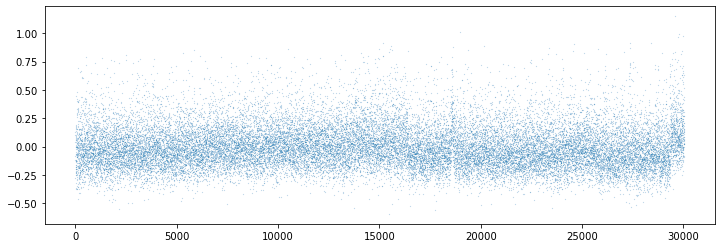

In [61]:
plt.figure(figsize=(12,4))
plt.scatter(comp["rank"],comp.ADP,s=.01)

In [62]:
int_values = predictions

In [63]:
pred_cols = ["ADP","CRP","TRAP","PAR1","PAR4"]

23 BKPS
23 BKPS


<Figure size 1008x504 with 0 Axes>

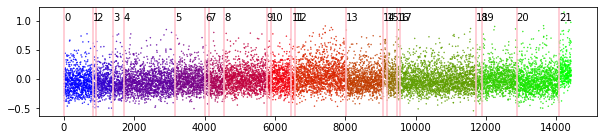

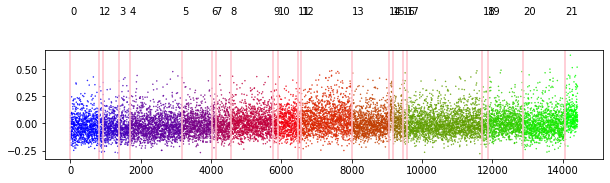

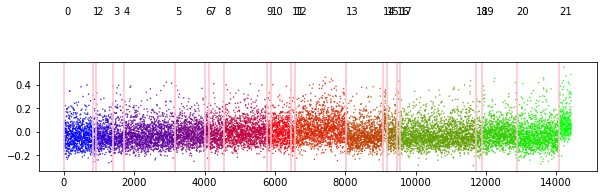

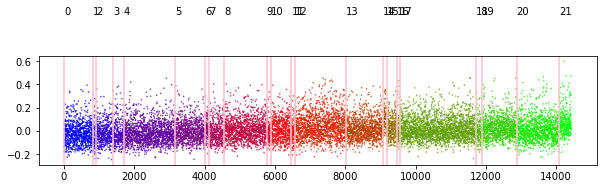

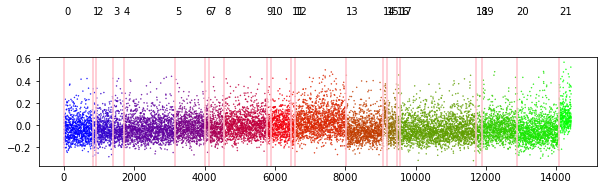

<Figure size 1008x504 with 0 Axes>

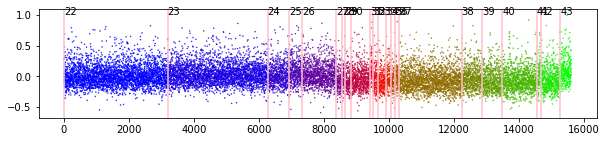

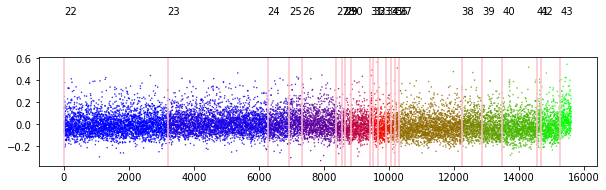

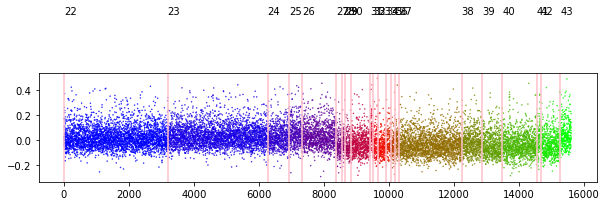

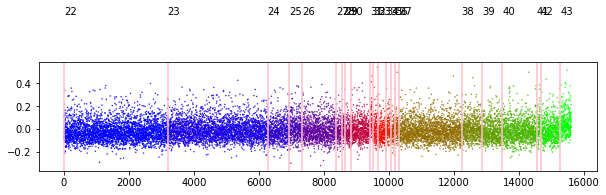

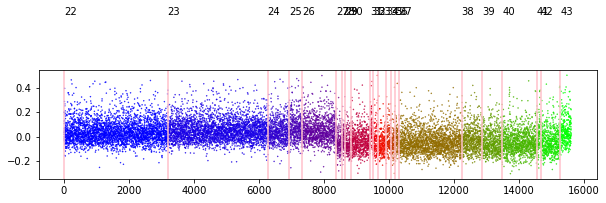

In [64]:
cohort_offset = 0
machines = int_phen["Instrument"].unique().tolist()
int_infos = []
for instrument in machines:
    int_info = pd.merge(int_values, int_phen.loc[int_phen.Instrument == instrument,
                                                      ["SampleNo","DateTime"]],
                        left_index=True,right_on="SampleNo",how="inner")
    
    int_info.sort_values("DateTime",inplace=True)
    X = int_info[pred_cols].values
    
    algo_c = rp.KernelCPD(kernel="rbf", min_size=100).fit(
        X
    )
    
    bkps = algo_c.predict(pen=2.)
    bkps = [0] + bkps
    print("%d BKPS" % len(bkps))

    int_info["cohort"] = cohort_offset
    int_info["rank"] = np.arange(int_info.shape[0])
    for b in bkps[1:]:
        int_info.loc[int_info["rank"] >= b,"cohort"] += 1

    plt.figure(figsize=(14,7))
    for i in range(X.shape[1]):
        plt.figure(figsize=(10,2))
        plt.scatter(int_info["rank"],X[:,i],s=.2,c=int_info.cohort,cmap="brg")
        for j, b in enumerate(bkps[:-1]):
            plt.axvline(int_info["rank"].iloc[b],c="pink")
            plt.text(int_info["rank"].iloc[b], 1, "%d" % int_info.iloc[b].cohort)
    int_infos.append(int_info)
    cohort_offset = int_info.cohort.max() + 1
int_info = pd.concat(int_infos,axis=0)

In [65]:
int_info.loc[(int_info.cohort == 20),"rank"].min()

12871

In [66]:
int_info.loc[int_info.cohort >= 16].shape

(20573, 19)

In [67]:
for c in int_info.cohort.unique():
    cond = int_info.cohort == c
    int_info.loc[cond,pred_cols] -= int_info.loc[cond,pred_cols].mean()
    int_info.loc[cond,pred_cols] /= int_info.loc[cond,pred_cols].std()

In [68]:
int_info.columns

Index(['ADP_PSEL', 'ADP_FIB', 'ADP', 'CRP_PSEL', 'CRP_FIB', 'CRP', 'TRAP_PSEL',
       'TRAP_FIB', 'TRAP', 'PAR1_PSEL', 'PAR1_FIB', 'PAR1', 'PAR4_PSEL',
       'PAR4_FIB', 'PAR4', 'SampleNo', 'DateTime', 'cohort', 'rank'],
      dtype='object')

In [69]:
int_info = int_info.set_index("SampleNo")

In [70]:
int_info.head()

,ADP_PSEL,ADP_FIB,ADP,CRP_PSEL,CRP_FIB,CRP,TRAP_PSEL,TRAP_FIB,TRAP,PAR1_PSEL,PAR1_FIB,PAR1,PAR4_PSEL,PAR4_FIB,PAR4,DateTime,cohort,rank
SampleNo,,,,,,,,,,,,,,,,,,
INT_116_6580100,-0.071889,-0.084988,-0.185911,-0.035029,-0.048417,-0.172706,-0.023905,-0.052377,-0.097876,-0.026518,-0.054462,-0.219907,-0.028134,-0.044825,-0.076870,2013-03-01 10:19:44,0,0
INT_116_6580000,-0.268005,-0.292962,-1.249674,-0.142327,-0.173904,-1.249606,-0.126934,-0.167886,-1.260842,-0.095090,-0.176834,-1.239859,-0.124865,-0.186741,-1.263175,2013-03-01 10:21:00,0,1
INT_116_4555900,0.039941,0.044634,0.460792,0.011973,0.020948,0.403823,0.009326,0.024250,0.447861,0.007024,0.025191,0.375940,0.015998,0.024883,0.485688,2013-03-01 10:23:33,0,2
INT_116_4555800,-0.119769,-0.125636,-0.408796,-0.074222,-0.081048,-0.469941,-0.072470,-0.070698,-0.489478,-0.048344,-0.075264,-0.455674,-0.061869,-0.089762,-0.471021,2013-03-01 10:24:49,0,3
INT_116_4556000,0.090854,0.105197,0.753056,0.049226,0.065265,0.778093,0.033405,0.060635,0.774853,0.036512,0.069751,0.778130,0.037338,0.060202,0.762617,2013-03-01 10:26:06,0,4


In [71]:
int_info[predictions.columns].to_csv("%s/processed/predictions.csv" % data_dir)

In [72]:
int_info[["cohort"]].to_csv("%s/processed/bkpts_cohorts.csv" % data_dir)

(array([0.00078233, 0.01724857, 0.20020259, 0.4381434 , 0.29616869,
        0.11198529, 0.03669511, 0.01221929, 0.0047685 , 0.00081959]),
 array([-3.50513949, -2.61151108, -1.71788268, -0.82425427,  0.06937414,
         0.96300255,  1.85663096,  2.75025936,  3.64388777,  4.53751618,
         5.43114459]),
 <a list of 10 Patch objects>)

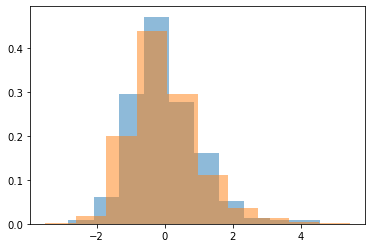

In [330]:
plt.hist(int_info.loc[int_info.cohort == 24,"ADP"],alpha=.5,density=True)
plt.hist(int_info["ADP"],alpha=.5,density=True)

# Prepare cofactors for adjustment

In [331]:
int_phen["days_since_start"] = (int_phen.day - int_phen.day.min()).dt.days

In [332]:
int_phen["log_ht"] = np.log10(int_phen["ht_bl"])
int_phen["log_wt"] = np.log10(int_phen["wt_bl"])

In [333]:
int_phen["smFreq_bl"].value_counts()
int_phen["smoking_freq"] = int_phen["smFreq_bl"]
int_phen["smoking_time"] = int_phen[["smCig_bl","smCigar_bl","smPipe_bl"]].max(skipna=True)
int_phen.loc[int_phen.smoking_freq.isnull(),"smoking_freq"] = 0.
int_phen.loc[int_phen.smoking_time.isnull(),"smoking_time"] = 0.

In [334]:
to_dummify = ["centre","Sex","Instrument","menopause_bl","pill_bl","in_cohort","cohort"]
to_bin = {"Age":10,"hours":5,"yearday":12,"days_since_start":60}
continuous = ["log_ht","log_wt","smoking_freq","smoking_time"]

In [335]:
comp = pd.merge(predictions,int_phen,left_index=True,right_on="SampleNo")
comp = pd.merge(comp, int_info[["cohort"]],left_on="SampleNo",right_index=True)
comp["DateTime"] = pd.to_datetime(comp["DateTime"])
comp.sort_values("DateTime",inplace=True)
comp["rank"] = np.arange(comp.shape[0])
comp = comp.sort_values(["Instrument","days_since_start"])
comp = comp.set_index("SampleNo")

In [336]:
dummified = {}
for c in to_dummify:
    comp.loc[comp[c].isnull(),c] = -1
    dummies = pd.get_dummies(comp[c],drop_first=False)
    dummies = dummies.add_prefix(c+"_")
    dummified[c] = list(dummies.columns)
    comp[dummies.columns] = dummies

In [337]:
binned = {}
for c in to_bin:
    quantiles = np.quantile(comp[c],np.linspace(0,1,to_bin[c],endpoint=True))
    bins = np.digitize(comp[c],quantiles)
    binned_ = pd.Series(index=comp.index,data=bins)
    dummies = pd.get_dummies(binned_,drop_first=False)
    dummies = dummies.add_prefix(c+"_")
    binned[c] = list(dummies.columns)
    comp[dummies.columns] = dummies

In [339]:
# 1 : compensate for technical effects
comp_technical = comp[list(predictions.columns) + dummified["cohort"] + binned["days_since_start"] + dummified["Instrument"] + binned["hours"] + binned["yearday"]]

In [340]:
for m in dummified["Instrument"]:
    for t in binned["days_since_start"]:
        comp_technical["%s_%s" % (m,t)] = comp_technical[m]*comp_technical[t]
for c in binned["days_since_start"]:
    del comp_technical[c]

In [341]:
comp_technical.columns

Index(['ADP_PSEL', 'ADP_FIB', 'ADP', 'CRP_PSEL', 'CRP_FIB', 'CRP', 'TRAP_PSEL',
       'TRAP_FIB', 'TRAP', 'PAR1_PSEL',
       ...
       'Instrument_XN-10^11041_days_since_start_51',
       'Instrument_XN-10^11041_days_since_start_52',
       'Instrument_XN-10^11041_days_since_start_53',
       'Instrument_XN-10^11041_days_since_start_54',
       'Instrument_XN-10^11041_days_since_start_55',
       'Instrument_XN-10^11041_days_since_start_56',
       'Instrument_XN-10^11041_days_since_start_57',
       'Instrument_XN-10^11041_days_since_start_58',
       'Instrument_XN-10^11041_days_since_start_59',
       'Instrument_XN-10^11041_days_since_start_60'],
      dtype='object', length=197)

In [342]:
Y = comp_technical["ADP"]
X = comp_technical[[c for c in comp_technical.columns if c not in predictions.columns]]

In [343]:
lm = LinearRegression(fit_intercept=True)
lm.fit(X,Y)
Y_technically_corrected = Y - lm.predict(X)

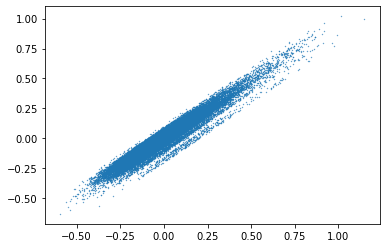

In [344]:
plt.scatter(Y,Y_technically_corrected,s=.1)

In [345]:
comp["ADP_technically_corrected"] = Y_technically_corrected

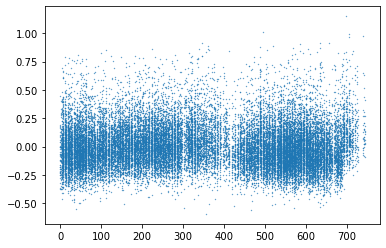

In [346]:
plt.scatter(comp.days_since_start, comp.ADP,s=.1)

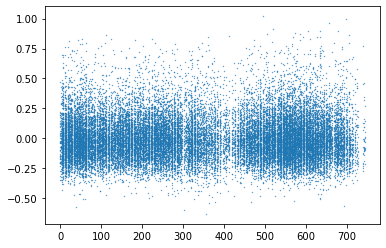

In [347]:
plt.scatter(comp.days_since_start, comp.ADP_technically_corrected,s=.1)

In [348]:
#2  compensate for cofactors
comp_cofactors = comp[["ADP_technically_corrected"] + \
                      continuous + \
                      binned["Age"] + \
                      dummified["Sex"] + \
                      dummified["menopause_bl"] + \
                      dummified["pill_bl"] + \
                      dummified["in_cohort"]]

In [349]:
comp_cofactors

,ADP_technically_corrected,log_ht,log_wt,smoking_freq,smoking_time,Age_1,Age_2,Age_3,Age_4,Age_5,...,menopause_bl_2.0,menopause_bl_3.0,menopause_bl_4.0,menopause_bl_999.0,pill_bl_-1.0,pill_bl_0.0,pill_bl_1.0,pill_bl_999.0,in_cohort_24,in_cohort_BL
SampleNo,,,,,,,,,,,,,,,,,,,,,
INT_116_2126200,0.003410,0.249933,1.899708,0.0,0.0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
INT_116_2126400,0.289147,0.211015,1.812006,0.0,0.0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,1
INT_116_146000,-0.079001,0.217748,1.793391,6.5,0.0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
INT_116_146200,-0.043314,0.211015,2.036881,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
INT_116_2126800,0.165405,0.237343,1.921488,0.0,0.0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INT_116_978800,0.344785,0.217748,1.937704,1.5,0.0,0,0,1,0,0,...,1,0,0,0,0,0,1,0,1,0
INT_116_7194100,0.458836,0.197226,1.799685,0.0,0.0,1,0,0,0,0,...,1,0,0,0,0,1,0,0,1,0
INT_116_7190800,-0.019916,0.237343,1.796549,0.0,0.0,1,0,0,0,0,...,1,0,0,0,0,0,1,0,1,0


In [350]:
Y = comp_cofactors["ADP_technically_corrected"]
X = comp_cofactors[[c for c in list(comp_cofactors.columns) if c not in predictions.columns and c != "ADP_technically_corrected"]]

In [351]:
lm = LinearRegression(fit_intercept=True)
lm.fit(X,Y)
Y_cofactor_corrected = Y - lm.predict(X)

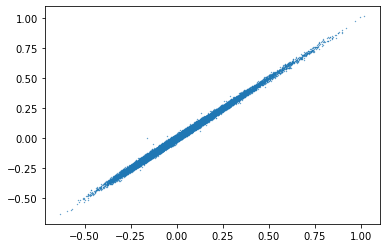

In [352]:
plt.scatter(Y,Y_cofactor_corrected,s=.1)

In [353]:
comp["ADP_cofactor_corrected"] = Y_cofactor_corrected

In [354]:
comp[list(predictions.columns) + ["ADP_cofactor_corrected"]].to_csv("%s/processed/predictions.csv" % data_dir)